# Worshop 05: Segmentación k-means y clasificación
## Por: Juan Camilo Aros y Alma Wetting

En este taller se desarrolló un flujo de clasificación de coberturas del suelo a partir de imágenes Sentinel-2, combinando técnicas no supervisadas y supervisadas.

Primero, se aplicó el algoritmo K-Means para identificar agrupaciones espectrales dentro de la imagen. A partir del número óptimo de clusters, se generaron variables dummy para cada clase y se normalizaron las bandas entre (0-5), creando un stack multibanda que integró tanto las bandas originales como las derivadas del K-Means.

Posteriormente, se entrenó un modelo Random Forest utilizando variables espectrales, índices y las capas dummy, generando un mapa final de clasificación.

Todos los resultados y productos intermedios se almacenaron en formato HDF5, permitiendo una gestión eficiente de los datos y sus metadatos.

En este segmento se importan las librerías necesarias para el procesamiento geoespacial: RSGISLib, para el análisis de datos ráster; GeoPandas, para el manejo de datos vectoriales; y se instala el paquete matplotlib-scalebar, que permite añadir barras de escala a las visualizaciones cartográficas.

In [2]:
import rsgislib
print("rsgislib se importó correctamente. Versión:", rsgislib.__version__)

rsgislib se importó correctamente. Versión: 5.1.7


In [3]:
import geopandas
print("geopandas se importó correctamente. Versión:", geopandas.__version__)

geopandas se importó correctamente. Versión: 1.0.1


Se importan librerías necesarias para el análisis y visualización de datos espaciales, como os, GeoPandas y Matplotlib, junto con módulos específicos de RSGISLib para clasificación, estadísticas y manejo de archivos ráster. Además, se incluyen funciones de scikit-learn para la creación y optimización del modelo Random Forest.

In [5]:
# Import modules from python standard library
import os
import pprint
import random

# Import Geopandas for vector analysis (https://geopandas.org)
import geopandas

# Import the matplotlib plotting module and set it to work within
# a notebook environment.
%matplotlib inline
import matplotlib
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt

# Import the RSGISLib modules for the notebook
import rsgislib
import rsgislib.classification
import rsgislib.classification.classsklearn
import rsgislib.tools.filetools
import rsgislib.tools.mapping
import rsgislib.tools.plotting
import rsgislib.vectorutils
import rsgislib.zonalstats
from sklearn.ensemble import RandomForestClassifier

# scikit-learn imports
from sklearn.model_selection import GridSearchCV

Se definen las rutas de los archivos de entrada: la imagen Sentinel-2 a 20 m de resolución, su máscara de píxeles válidos (sin regiones de datos nulos) y el archivo vectorial con las muestras de entrenamiento que se usarán para entrenar el modelo de clasificación.

In [6]:
# Input Sentinel-2 image file with 20 m resolution pixels.
input_img = "./Data/sen2_20180629_t30uvd_orb037_osgb_stdsref_20m.tif"

# A valid pixel mask for the input image - this is required for later
# steps but note that for this particular image all the pixel values
# are valid (i.e., there aren't are no data regions).
in_msk_img = "./Data/sen2_20180629_t30uvd_orb037_osgb_stdsref_20m_vmsk.tif"

vec_train_file = "./Data/aber_sen2_cls_training.gpkg"

Se obtiene y muestra la lista de capas contenidas en el archivo vectorial de entrenamiento, lo cual permite verificar qué capas están disponibles para el proceso de clasificación.

In [7]:
lyr_names = rsgislib.vectorutils.get_vec_lyrs_lst(vec_train_file)
print(lyr_names )

['Artificial_Surfaces', 'Bare_Rock_Sand', 'Conifer_Forest', 'Deciduous_Forest', 'Grass_Long', 'Grass_Short', 'NonPhotosynthetic_Vegetation', 'Scrub', 'Water_Training', 'Bracken']


Se obtiene y muestra la extensión geográfica (bounding box) de la imagen Sentinel-2, lo que permite conocer el área espacial cubierta por el ráster.

In [8]:
# Get the full image bounding box.
img_bbox = rsgislib.imageutils.get_img_bbox(input_img)
print(img_bbox)

(249177.3321426216, 315077.3321426216, 268742.255157026, 326342.255157026)


Se define una ventana espacial (bounding box) para visualizar un subconjunto de la imagen Sentinel-2. Luego, se prepara un lienzo de Matplotlib y se genera una composición RGB usando tres bandas seleccionadas, aplicando un estiramiento de histograma para mejorar el contraste y añadiendo una barra de escala. A continuación, se cargan las capas de entrenamiento del archivo vectorial, asignando a cada clase un color aleatorio para facilitar su visualización. Finalmente, se superponen los polígonos de entrenamiento sobre la imagen, generando un mapa combinado que muestra tanto la información espectral como las muestras de entrenamiento.

Image Data Size: 1250 x 1250


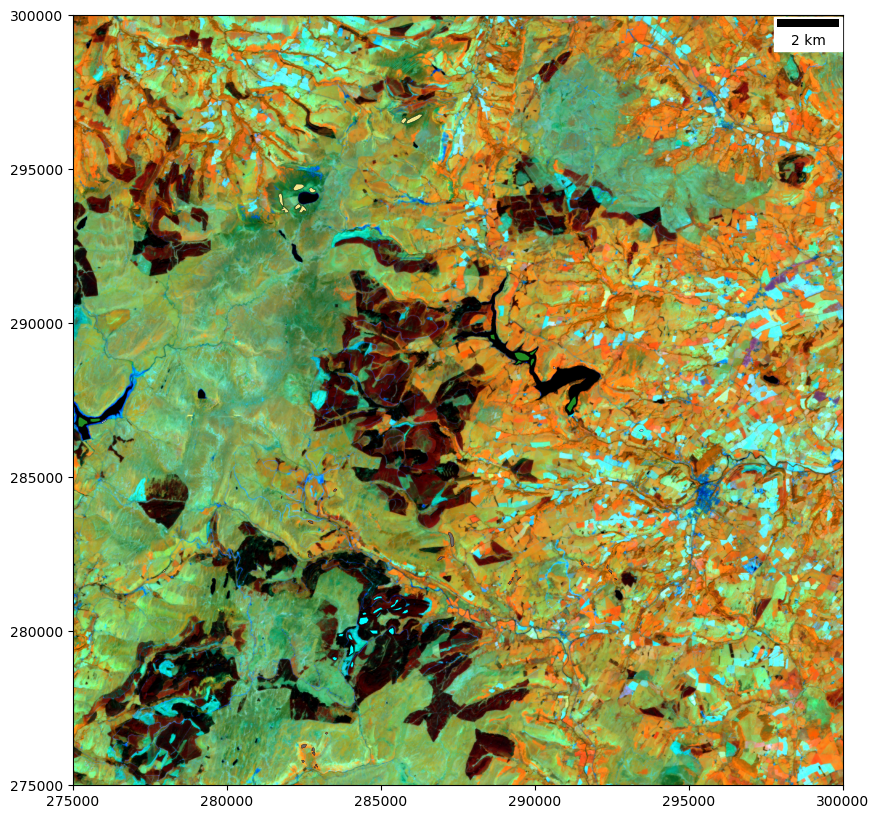

In [9]:
# ---------------------------------------------------------
# 1. Define the map window using four OSGB coordinates: xmin, xmax, ymin, ymax (metres).
sub_img_bbox = [275_000, 300_000, 275_000, 300_000]
# ---------------------------------------------------------
# 2. Prepare a Matplotlib canvas
#    One axis, 10 × 10 inches – large enough for legible detail.
fig, ax = plt.subplots(figsize=(10, 10))
# ---------------------------------------------------------
# 3. Draw a Sentinel-2 RGB composite
#    * input_img       : full multispectral stack
#    * img_bands       : [8 (NIR), 9 (red-edge), 3 (green)]
#    * img_stch        : cumulative histogram stretch for contrast
#    * bbox            : clip to the subset
#    * show_scale_bar  : adds a 5 km bar bottom-left
# ---------------------------------------------------------
rsgislib.tools.mapping.create_raster_img_map(
    ax,
    input_img,
    img_bands=[8, 9, 3],
    img_stch=rsgislib.IMG_STRETCH_CUMULATIVE,
    bbox=sub_img_bbox,
    show_scale_bar=True,
)

# ---------------------------------------------------------
# 4. Build a palette of distinct colours
#    CSS4 provides ~140 named colours; we convert the dict keys
#    to a list so random.choice can pick from it.
mpl_clrs = list(mcolors.CSS4_COLORS.keys())

# Lists to store GeoPandas layers and their display colours
gp_vecs  = []
lyr_clrs = []

# ---------------------------------------------------------
# 5. Load each training layer and assign a random colour
#    * lyr_names        : list of class layers in the GeoPackage
#    * vec_train_file   : path to the training samples (GPKG)
for lyr_name in lyr_names:
    # Read the class layer as a GeoDataFrame
    gp_vecs.append(geopandas.read_file(vec_train_file, layer=lyr_name))
    # Pick a random CSS colour to fill that class
    lyr_clrs.append(random.choice(mpl_clrs))

# ---------------------------------------------------------
# 6. Overlay the training vectors on the RGB image
#    * gp_vecs         : list of GeoDataFrames (one per class)
#    * vec_fill_clrs   : matching list of fill colours
#    * vec_line_clrs   : outline colour (“black” for all)
#    * bbox            : ensures vectors are clipped to the subset
#    * show_scale_bar  : False – we already drew one above
# ---------------------------------------------------------
rsgislib.tools.mapping.create_vec_lyr_map(
    ax,
    gp_vecs=gp_vecs,
    bbox=sub_img_bbox,
    vec_fill_clrs=lyr_clrs,
    vec_line_clrs="black",
    show_scale_bar=False,
)

Se instalan las librerías necesarias para el procesamiento y análisis de imágenes ráster y su visualización: **rasterio** para manejo de archivos ráster, **matplotlib** para generación de gráficos, **numpy** para cálculos numéricos y **scikit-image** para procesamiento de imágenes.

Se importan librerías esenciales para el análisis: **NumPy** para cálculos numéricos, **Matplotlib** para visualización, y **Rasterio** para leer y manejar imágenes ráster. También se cargan herramientas de **scikit-learn** para aplicar el algoritmo de **K-Means** y calcular la **silhouette score**, junto con **scikit-image** para mejorar el contraste de las imágenes mediante ecualización adaptativa.


In [14]:
# Standard and scientific libraries
import numpy as np
import matplotlib.pyplot as plt
import rasterio as rio
import rasterio.windows as rwin

# Machine-learning tools
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Image-enhancement for visual interpretation
from skimage.exposure import equalize_adapthist

Se define la ruta del archivo ráster original y la del archivo de salida. Luego, se lee la imagen completa usando **Rasterio**, manteniendo su resolución y dimensiones originales. Solo se agrega **compresión LZW** para optimizar el almacenamiento. Finalmente, se guarda el archivo y se imprime un resumen de metadatos clave como dimensiones, número de bandas, sistema de referencia (CRS), tipo de datos y el transformador espacial.

In [15]:
m_root = r'./data/'
raster_path = m_root + r'sen2_20180629_t30uvd_orb037_osgb_stdsref_20m.tif'
subset_path = m_root + r'subset_FINAL.tif' 

with rio.open(raster_path) as src:
    subset = src.read()  # Leer toda la imagen completa
    meta = src.meta.copy()
    meta.update({"compress": "lzw", "tiled": True})  

with rio.open(subset_path, "w", **meta) as dst:
    dst.write(subset)

print("Subset written in →", subset_path)

# --- Print key metadata fields to understand what is stored ---
print("Subset metadata summary:")
print(f"  Dimensions    → {meta['width']} × {meta['height']} px")
print(f"  Band count    → {meta['count']} bands")
print(f"  CRS           → {meta['crs']}")
print(f"  Data type     → {meta['dtype']}")
print(f"  Transform     →\n    {meta['transform']}")

Subset written in → ./data/subset_FINAL.tif
Subset metadata summary:
  Dimensions    → 3295 × 2880 px
  Band count    → 10 bands
  CRS           → EPSG:27700
  Data type     → uint16
  Transform     →
    | 20.00, 0.00, 249177.33|
| 0.00,-20.00, 326342.26|
| 0.00, 0.00, 1.00|


Se abre la imagen ráster y se calcula el número total de bandas. Luego, se recorre cada banda para obtener sus valores mínimo y máximo, ignorando los valores **NoData** si existen. Esto permite conocer el rango de valores espectrales por banda antes de realizar cualquier análisis o procesamiento posterior.

In [16]:
import rasterio
import numpy as np

# Ruta de tu imagen
ruta_img = r'./data/sen2_20180629_t30uvd_orb037_osgb_stdsref_20m.tif'

# Abrir la imagen
with rasterio.open(ruta_img) as src:
    num_bandas = src.count
    print(f"Número de bandas: {num_bandas}\n")
    
    # Recorrer cada banda
    for i in range(1, num_bandas + 1):
        banda = src.read(i)
        
        # Calcular min y max ignorando los nodata
        nodata = src.nodata
        if nodata is not None:
            banda = np.where(banda != nodata, banda, np.nan)
        
        minimo = np.nanmin(banda)
        maximo = np.nanmax(banda)
        
        print(f"Banda {i}: Min = {minimo}, Max = {maximo}")


Número de bandas: 10

Banda 1: Min = 11.0, Max = 1020.0
Banda 2: Min = 8.0, Max = 1006.0
Banda 3: Min = 1.0, Max = 947.0
Banda 4: Min = 1.0, Max = 632.0
Banda 5: Min = 1.0, Max = 777.0
Banda 6: Min = 1.0, Max = 938.0
Banda 7: Min = 1.0, Max = 1005.0
Banda 8: Min = 1.0, Max = 1034.0
Banda 9: Min = 1.0, Max = 863.0
Banda 10: Min = 1.0, Max = 934.0


Se genera una vista previa en **RGB falso color** utilizando las bandas 8, 4 y 3 del Sentinel-2 (NIR, Red y Green). Se aplica un estiramiento entre los percentiles 5% y 98% para mejorar el contraste y un ajuste de **gamma** (0.7) para resaltar detalles. Finalmente, se muestra la imagen con **Matplotlib**, sin ejes y con un título descriptivo.

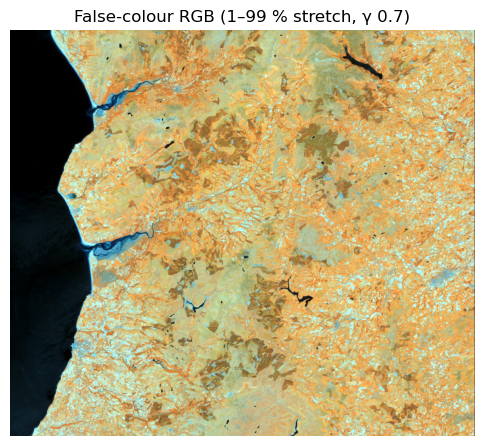

In [17]:
#· RGB preview (bands 4-3-2 )
with rio.open(subset_path) as src:
    img = src.read()

bands_rgb = (8, 4, 3)                            # R-G-B (1-based)
gamma     = 0.7                                 # contrast tweak

channels = []
for b in bands_rgb:
    band = img[b-1].astype(float)
    lo, hi = np.percentile(band, (5, 98))
    band = np.clip((band - lo) / (hi - lo), 0, 1)
    channels.append(band)

rgb = np.dstack(channels) ** gamma

plt.figure(figsize=(6, 6))
plt.imshow(rgb)
plt.title("False-colour RGB (1–99 % stretch, γ 0.7)")
plt.axis("off")
plt.show()

Se crea una visualización en **color natural** usando las bandas 3, 2 y 1 (Red, Green y Blue) de la imagen Sentinel-2. Se aplica un estiramiento de contraste entre los percentiles 1% y 99%, junto con una corrección de **gamma** (0.7), para mejorar la visualización. La imagen se muestra con **Matplotlib**, sin ejes y con un título que indica el tipo de visualización.

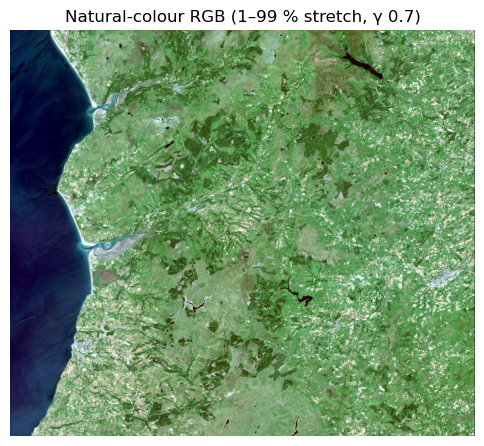

In [18]:
#· RGB preview (bands 4-3-2 )
with rio.open(subset_path) as src:
    img = src.read()

bands_rgb = (3, 2, 1)                            # R-G-B (1-based)
gamma     = 0.7                                 # contrast tweak

channels = []
for b in bands_rgb:
    band = img[b-1].astype(float)
    lo, hi = np.percentile(band, (1, 99))
    band = np.clip((band - lo) / (hi - lo), 0, 1)
    channels.append(band)

rgb = np.dstack(channels) ** gamma

plt.figure(figsize=(6, 6))
plt.imshow(rgb)
plt.title("Natural-colour RGB (1–99 % stretch, γ 0.7)")
plt.axis("off")
plt.show()

Se genera un **gráfico de dispersión (scatter plot)** entre la **Banda 3 (Green)** y la **Banda 4 (Red)** de la imagen. Cada punto representa un píxel, permitiendo analizar la relación espectral entre ambas bandas. Se usa un tamaño de punto pequeño y baja opacidad (**alpha=0.3**) para evitar saturación visual.

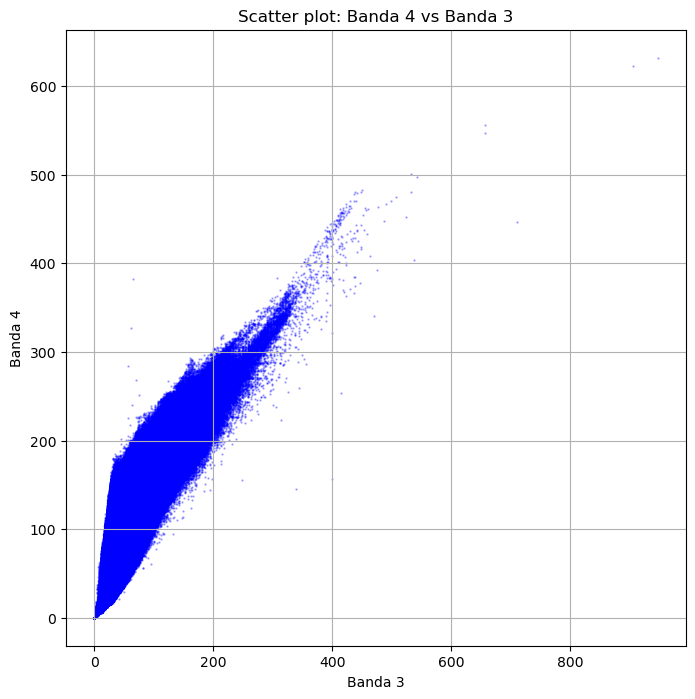

In [19]:
# Scatter plot Banda 4 vs Banda 2
banda4 = img[3].astype(float)  
banda3 = img[2].astype(float)  

x = banda3.flatten()
y = banda4.flatten()

plt.figure(figsize=(8, 8))
plt.scatter(x, y, s=0.5, alpha=0.3, color='blue')
plt.xlabel("Banda 3")
plt.ylabel("Banda 4")
plt.title("Scatter plot: Banda 4 vs Banda 3")
plt.grid(True)
plt.show()

Se genera un **gráfico de dispersión** entre la **Banda 2 (Blue)** y la **Banda 4 (Red)** de la imagen, donde cada punto representa un píxel. Esto permite visualizar la relación espectral entre ambas bandas y explorar posibles agrupaciones o patrones en los datos.


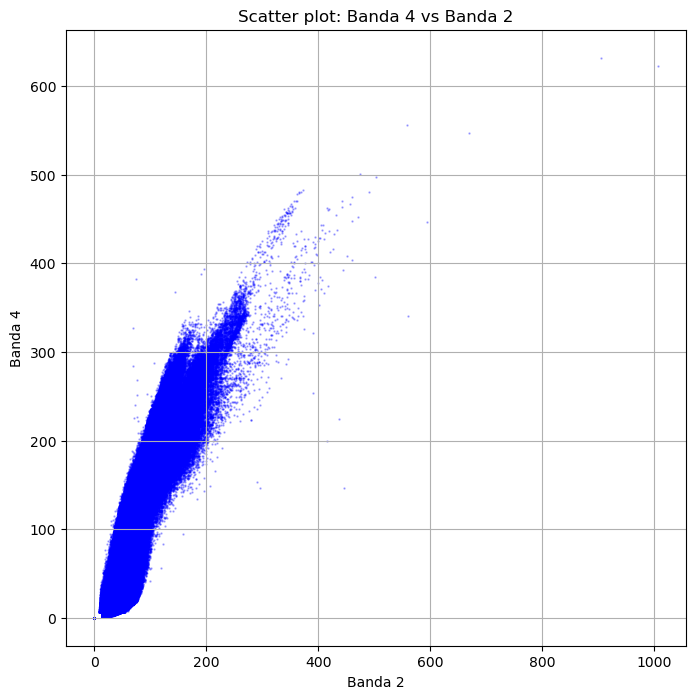

In [20]:
# Scatter plot Banda 4 vs Banda 2
banda4 = img[3].astype(float)  
banda2 = img[1].astype(float)  

x = banda2.flatten()
y = banda4.flatten()

plt.figure(figsize=(8, 8))
plt.scatter(x, y, s=0.5, alpha=0.3, color='blue')
plt.xlabel("Banda 2")
plt.ylabel("Banda 4")
plt.title("Scatter plot: Banda 4 vs Banda 2")
plt.grid(True)
plt.show()

Se crea un **scatter plot** entre la **Banda 8 (NIR)** y la **Banda 4 (Red)** de la imagen, representando la relación espectral entre ambas. Este tipo de gráfico es útil para analizar la respuesta de la vegetación y distinguir diferentes tipos de cobertura del suelo.


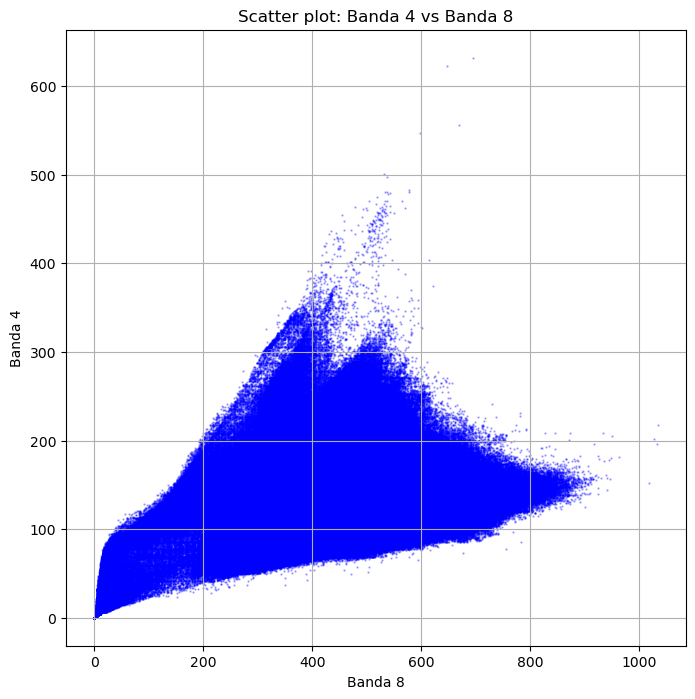

In [21]:
# Scatter plot Banda 4 vs Banda 8
banda8 = img[7].astype(float)  
banda4 = img[3].astype(float)  

x = banda8.flatten()
y = banda4.flatten()

plt.figure(figsize=(8, 8))
plt.scatter(x, y, s=0.5, alpha=0.3, color='blue')
plt.xlabel("Banda 8")
plt.ylabel("Banda 4")
plt.title("Scatter plot: Banda 4 vs Banda 8")
plt.grid(True)
plt.show()

Se define la clase **`ClusteredStack`**, que automatiza todo el proceso de clasificación no supervisada usando **K-Means** sobre imágenes multibanda. La clase permite leer y preparar el stack ráster, entrenar modelos para distintos valores de **k**, almacenar resultados y métricas como **inercia** y **silhouette score**, visualizar tanto los mapas de clasificación como las curvas de evaluación, y finalmente guardar el resultado óptimo como un nuevo archivo **GeoTIFF**.

In [22]:
# %% Listings 5-7 completos (adaptados)
class ClusteredStack:
    
    def __init__(self, raster_path): # Initialises the class instance.
        self.raster_path = raster_path # path to the multiband GeoTIFF (e.g., the 400×400 subset).  
        self.model_input = None #    the reshaped data matrix  
        self.height = self.width = self.depth = 0 # image dimensions
        self.k_range = [] # List of all k-values (number of clusters) to evaluate
        self.models = [] # Trained KMeans models for each k; stored for later inspection
        self.predicted_rasters = [] # Cluster label images (reshaped to raster size)
        self.inertia_scores = [] # Inertia values (sum of squared distances within clusters); used for Elbow method
        self.silhouette_scores = [] # Silhouette scores (measure of cluster separation); used for model selection

    
    def set_raster_stack(self):
        """Reads the raster and reshapes it into a format suitable for K-Means."""
        with rio.open(self.raster_path) as src:

            # Read all bands into a 3D NumPy array of shape (bands, rows, cols)
            stack = src.read()

             # Replace any NaN (Not-a-Number) values with zero. Avoids errors during clustering algorithms, which cannot handle NaNs
            stack = np.nan_to_num(stack)   
        # Extract the number of bands, rows, and columns from the raster's shape
        # These values are stored as object attributes for later use
        self.depth, self.height, self.width = stack.shape

        # Reshape the 3D array into a 2D matrix of shape (n_pixels, n_bands)
        # Each row now corresponds to one pixel, and each column to a spectral band
        # Transposition (.T) ensures the matrix has the correct shape for scikit-learn
        self.model_input = stack.reshape(self.depth, -1).T


    def build_models(self, k_values):
        """
            Trains one K-Means clustering model for each value of k provided in k_values.
         It stores the resulting models, cluster labels, and evaluation metrics.
        """

        # Convert the input iterable into a list and store it
        # This list defines the number of clusters to be tested (e.g. [3, 4, 5, ..., 10])
        self.k_range = list(k_values)

        # Initialise empty lists to store models, results, and metrics
        self.models, self.predicted_rasters = [], [] # Trained KMeans objects  - Cluster label images (reshaped to raster form)
        self.inertia_scores, self.silhouette_scores = [], [] # Inertia values for each k - # Silhouette scores for each k

        for k in self.k_range:

            # Create a KMeans model with k clusters
            # random_state ensures reproducibility; n_init specifies how many times the algorithm will run with different centroid seeds
            km = KMeans(n_clusters=k, random_state=42, n_init=10)

             # Fit the model to the reshaped raster and predict the cluster labels
             # This returns one label (cluster ID) per pixel
            labels = km.fit_predict(self.model_input)

            # Store the trained model
            self.models.append(km)

            # Record the inertia for this k (lower is better; used in Elbow method)
            self.inertia_scores.append(km.inertia_)

            # Calculate and store the silhouette score for this k
            # A higher silhouette score indicates better-defined clusters
            # Sampling is limited to 1000 points for performance reasons
            self.silhouette_scores.append(
                silhouette_score(self.model_input, labels, sample_size=1000)
            )

            # Reshape the flat list of labels back to image form (rows × cols)
            # This is required for visualising the classified image later
            self.predicted_rasters.append(labels.reshape(self.height, self.width))


    def show_clustered(self, cmap="Accent"):
        """
        Displays one classified raster image for each value of k.
        Each image uses a categorical colourmap for easy interpretation.
        """
        for k, img_cls in zip(self.k_range, self.predicted_rasters):
            plt.figure(figsize=(5, 5))
            plt.imshow(img_cls, cmap=cmap)
            plt.title(f"{k} clusters")
            plt.axis("off")
            plt.colorbar()
            plt.show()

    def show_inertia(self):
        """
        Plots the inertia values for each k to apply the Elbow method.
        Inertia measures how tightly the data points are clustered around their centroids.
        Lower values indicate more compact clusters.
        """
        plt.figure(figsize=(5, 4))
        plt.plot(self.k_range, self.inertia_scores, "o-")
        plt.xlabel("Number of clusters (k)")
        plt.ylabel("Inertia")
        plt.title("Elbow method")
        plt.show()

    def show_silhouette(self):
        """
        Plots the silhouette scores for each k to assess clustering quality.
        Silhouette score ranges from -1 to 1, with higher values indicating
        better-defined, well-separated clusters.
        """
        plt.figure(figsize=(5, 4))
        plt.plot(self.k_range, self.silhouette_scores, "o-")
        plt.xlabel("Número de clusters (k)")
        plt.ylabel("Silhouette Coeff.s")
        plt.title("Silhouette scores")
        plt.show()
        
    def save_clustered_raster(self, k_value, output_path):
        """
        Saves the clustered raster for the specified k as a new GeoTIFF.
        :param k_value: The k-value (number of clusters) to save.
        :param output_path: Output path for the new .tif file.
        """
        if k_value not in self.k_range:
            raise ValueError(f"No model was trained for k={k_value}")
    
        index = self.k_range.index(k_value)
        clustered = self.predicted_rasters[index]
    
        with rio.open(self.raster_path) as src:
            meta = src.meta.copy()
    
        # Modify metadata: 1 band, uint8 (sufficient for 3 clusters), and update dtype
        meta.update({
            "count": 1,
            "dtype": "uint8"
        })
    
        with rio.open(output_path, 'w', **meta) as dst:
            dst.write(clustered.astype('uint8'),1)

Se crea una instancia de la clase **`ClusteredStack`** utilizando el stack de bandas preparado. Luego, se carga y reformatea la imagen para el modelo, se define un rango de valores de **k** (de 3 a 10 clusters) y se entrena el **K-Means** para cada uno. Posteriormente, se visualizan los resultados: los mapas de clasificación por cada **k**, la curva de **inercia** (método del codo) y la **silhouette score** para evaluar la calidad de los clusters. Además, se muestra una vista previa RGB de la imagen original para comparar visualmente.

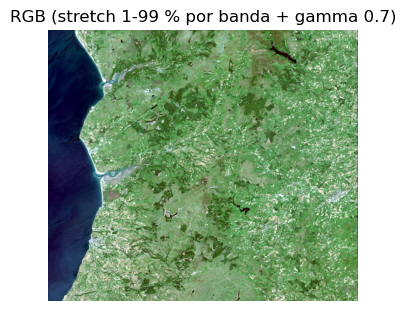

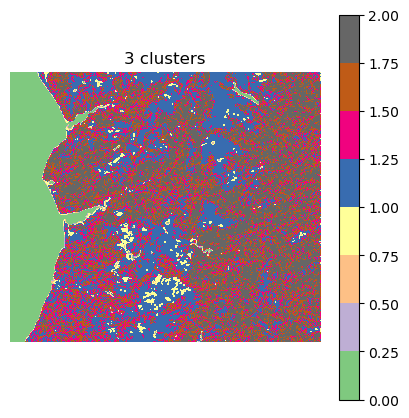

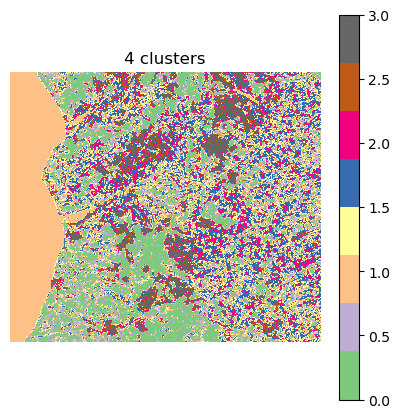

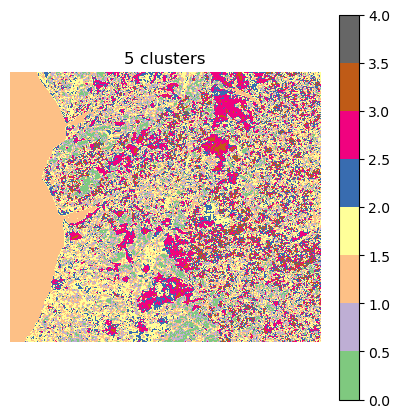

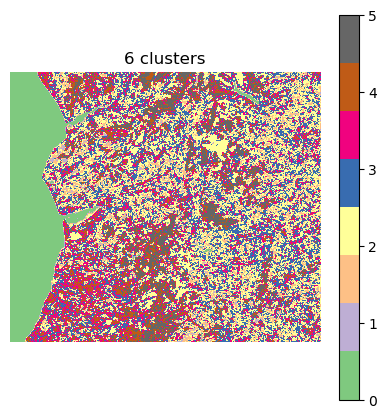

...

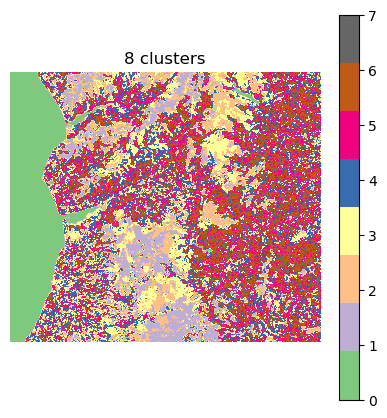

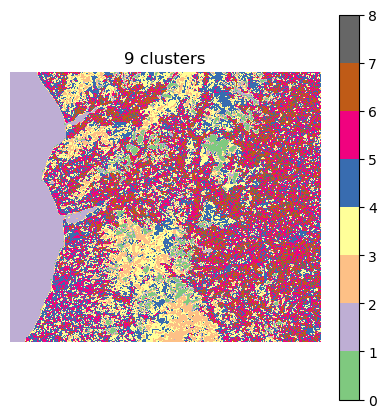

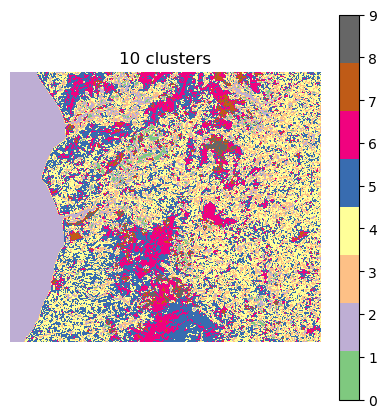

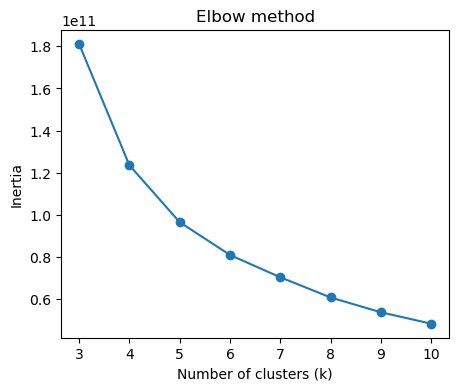

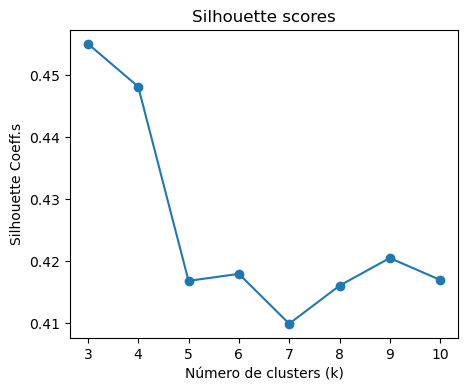

In [23]:
# ==== Model training and visualisation (tutorial-style layout) ====

# 1. Instantiate the object
# This creates an instance of the ClusteredStack class using the clipped raster
clustered_models = ClusteredStack(subset_path)

# Load the raster and reshape it into a 2D array of pixels × bands
clustered_models.set_raster_stack()

# 2. Define the range of k values (number of clusters to evaluate)
# Equivalent to testing k = 3, 4, ..., 10
ranges = np.arange(3, 11, 1)

# 3. Train the models
# For each k, this will:
# - Fit a KMeans model
# - Store the predicted labels
# - Compute inertia and silhouette scores
clustered_models.build_models(ranges)

# 4. Display the RGB preview again
# This step is optional but helps visually link the original image with the results
with rio.open(subset_path) as src:
    rgb_preview = src.read()                 # (bands, rows, cols)

plt.figure(figsize=(4,4))
plt.imshow(rgb)
plt.title("RGB (stretch 1-99 % por banda + gamma 0.7)")
plt.axis("off")
plt.show()

clustered_models.show_clustered()
clustered_models.show_inertia()

# --- Alias para mantener el nombre del tutorial ---
ClusteredStack.show_silhouette_scores = ClusteredStack.show_silhouette
clustered_models.show_silhouette_scores()

Tras analizar las gráficas de **inercia** y **silhouette**, se selecciona **k = 4** como el número óptimo de clusters. Luego, se vuelve a cargar y preparar el stack ráster, se entrena el modelo con **k=4**, y finalmente se guarda el mapa de clasificación resultante como un nuevo archivo **GeoTIFF** llamado **`clustered_k4.tif`**.


In [24]:
clustered_models.set_raster_stack()
clustered_models.build_models([4])
clustered_models.save_clustered_raster(4, "./data/clustered_k4.tif")

Se abre el archivo **`clustered_k4.tif`** y se visualiza la clasificación obtenida con **k=4**, usando una paleta de colores categórica (**'Accent'**) para diferenciar claramente los clusters. La imagen se presenta sin ejes y con barra de colores para facilitar la interpretación.


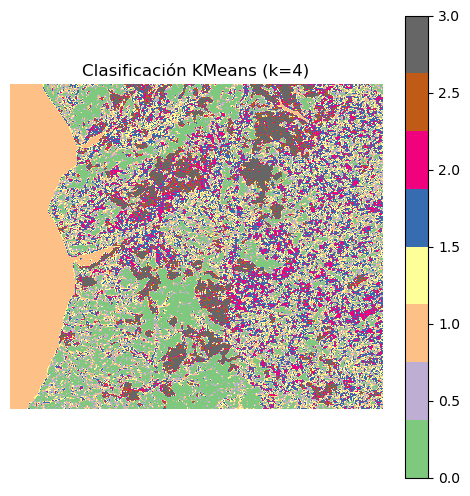

In [25]:
with rio.open("./data/clustered_k4.tif") as src:
    img = src.read(1)  

plt.figure(figsize=(6, 6))
plt.imshow(img, cmap='Accent')  
plt.title("Clasificación KMeans (k=4)")
plt.axis('off')
plt.colorbar()
plt.show()

Se carga el **subset multibanda original** y el resultado de la **clasificación K-Means (k=4)**. Luego, se apila la capa de clustering como una **banda adicional** al final del stack. Se actualizan los metadatos para reflejar el nuevo número de bandas y se guarda el resultado como un nuevo archivo **GeoTIFF comprimido** llamado **`subset_with_clusters.tif`**, que ahora incluye tanto las bandas originales como la clasificación K-Means.


In [26]:
# 1. Cargar el subset original (multibanda)
subset_path = m_root + 'subset_FINAL.tif'
with rio.open(subset_path) as src:
    subset = src.read()  # shape: (bands, height, width)
    meta = src.meta.copy()
    height, width = src.height, src.width
    transform = src.transform
    crs = src.crs

# 2. Cargar la imagen de clustering
clustered_path = m_root + 'clustered_k4.tif'
with rio.open(clustered_path) as cluster_src:
    clustered = cluster_src.read(1) 
    assert clustered.shape == (height, width), "Tamaño no coincide con el subset original"

# 3. Apilar la nueva banda al final del stack
new_stack = np.vstack((subset, clustered[np.newaxis, :, :]))  

# 4. Actualizar metadatos para incluir la nueva banda
meta.update({
    "count": new_stack.shape[0],
    "compress": "lzw",
    "tiled": True
})

# 5. Guardar el nuevo archivo combinado
stack_output_path = m_root + 'subset_with_clusters.tif'
with rio.open(stack_output_path, "w", **meta) as dst:
    dst.write(new_stack)

print(" Nuevo stack guardado con banda de clustering en:")
print("→", stack_output_path)

 Nuevo stack guardado con banda de clustering en:
→ ./data/subset_with_clusters.tif


Se abre el nuevo stack y se revisan sus características: número de bandas, dimensiones, sistema de referencia (**CRS**) y tipo de dato de cada banda. Además, se calculan los valores **mínimo** y **máximo** por banda para evaluar su rango. Si las bandas son de tipo entero, será necesario convertirlas a **float** para permitir una posterior **normalización con decimales**.


In [27]:
stack_path = m_root + 'subset_with_clusters.tif'

with rio.open(stack_path) as src:
    print(" Número de bandas:", src.count)
    print(" Dimensiones:", src.width, "x", src.height)
    print(" CRS:", src.crs)
    print(" Tipo de dato:", src.dtypes)

    # Listar estadísticas básicas de cada banda
    for i in range(1, src.count + 1):
        band = src.read(i)
        print(f"Banda {i}: min={band.min()}, max={band.max()}, dtype={band.dtype}")

 Número de bandas: 11
 Dimensiones: 3295 x 2880
 CRS: EPSG:27700
 Tipo de dato: ('uint16', 'uint16', 'uint16', 'uint16', 'uint16', 'uint16', 'uint16', 'uint16', 'uint16', 'uint16', 'uint16')
Banda 1: min=0, max=1020, dtype=uint16
Banda 2: min=0, max=1006, dtype=uint16
Banda 3: min=0, max=947, dtype=uint16
Banda 4: min=0, max=632, dtype=uint16
Banda 5: min=0, max=777, dtype=uint16
Banda 6: min=0, max=938, dtype=uint16
Banda 7: min=0, max=1005, dtype=uint16
Banda 8: min=0, max=1034, dtype=uint16
Banda 9: min=0, max=863, dtype=uint16
Banda 10: min=0, max=934, dtype=uint16
Banda 11: min=0, max=3, dtype=uint16


Se convierte todo el stack multibanda a tipo de dato **float32**, necesario para realizar operaciones con decimales como la **normalización**. Se actualizan los metadatos del archivo para reflejar el nuevo tipo de dato y se guarda el resultado como un nuevo archivo **GeoTIFF comprimido** llamado **`subset_with_clusters_float.tif`**.


In [28]:
stack_path = m_root + 'subset_with_clusters.tif'

# Nueva ruta para el stack en formato float
out_stack_path = m_root + 'subset_with_clusters_float.tif'

with rio.open(stack_path) as src:
    # Leer todo el stack y convertir a float32
    data = src.read().astype(np.float32)
    
    # Copiar y modificar metadata
    meta = src.meta.copy()
    meta.update({
        "dtype": "float32",
        "compress": "lzw",  # Opcional: para comprimir
        "tiled": True        # Opcional: para optimizar acceso
    })

    # Escribir el nuevo archivo
    with rio.open(out_stack_path, 'w', **meta) as dst:
        dst.write(data)

print("Stack convertido a float32 y guardado en →", out_stack_path)

Stack convertido a float32 y guardado en → ./data/subset_with_clusters_float.tif


Se verifica que todas las bandas del nuevo stack estén en formato **float32**, confirmando que la conversión fue exitosa. Además, se revisan nuevamente las dimensiones, el **CRS** y los rangos de valores mínimos y máximos por banda, asegurando que los datos estén listos para ser **normalizados** en los siguientes pasos.


In [29]:
stack_path = m_root + 'subset_with_clusters_float.tif'

with rio.open(stack_path) as src:
    print(" Número de bandas:", src.count)
    print(" Dimensiones:", src.width, "x", src.height)
    print(" CRS:", src.crs)
    print(" Tipo de dato:", src.dtypes)

    # Listar estadísticas básicas de cada banda
    for i in range(1, src.count + 1):
        band = src.read(i)
        print(f"Banda {i}: min={band.min()}, max={band.max()}, dtype={band.dtype}")

 Número de bandas: 11
 Dimensiones: 3295 x 2880
 CRS: EPSG:27700
 Tipo de dato: ('float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32')
Banda 1: min=0.0, max=1020.0, dtype=float32
Banda 2: min=0.0, max=1006.0, dtype=float32
Banda 3: min=0.0, max=947.0, dtype=float32
Banda 4: min=0.0, max=632.0, dtype=float32
Banda 5: min=0.0, max=777.0, dtype=float32
Banda 6: min=0.0, max=938.0, dtype=float32
Banda 7: min=0.0, max=1005.0, dtype=float32
Banda 8: min=0.0, max=1034.0, dtype=float32
Banda 9: min=0.0, max=863.0, dtype=float32
Banda 10: min=0.0, max=934.0, dtype=float32
Banda 11: min=0.0, max=3.0, dtype=float32


Se realiza la **normalización de las bandas 1 a 10**, escalando sus valores al rango **0 a 5** según los mínimos y máximos definidos previamente. La banda 11 (correspondiente al resultado del **K-Means**) se mantiene sin cambios. Finalmente, se guarda el nuevo stack normalizado como un archivo **GeoTIFF** llamado **`subset_with_clusters_float_norm.tif`**, con compresión y formato **float32**.


In [30]:
# Ruta de entrada y salida
in_stack = m_root + 'subset_with_clusters_float.tif'
out_stack_norm = m_root + 'subset_with_clusters_float_norm.tif'

# Min y max por banda (bandas 1 a 10)
band_min_max = [
    (0.0, 1020.0),
    (0.0, 1006.0),
    (0.0, 947.0),
    (0.0, 632.0),
    (0.0, 777.0),
    (0.0, 938.0),
    (0.0, 1005.0),
    (0.0, 1034.0),
    (0.0, 863.0),
    (0.0, 934.0),
]

with rio.open(in_stack) as src:
    data = src.read().astype(np.float32)  # Leer todo el stack
    meta = src.meta.copy()
    
    # Normalizar solo las bandas 1 a 10
    for i in range(10):  # i = 0 a 9 → bandas 1 a 10
        band = data[i]
        min_val, max_val = band_min_max[i]
        if max_val > min_val:
            # Normalización al rango 0-5
            norm_band = ((band - min_val) / (max_val - min_val)) * 5
            data[i] = norm_band
        else:
            print(f" Advertencia: Banda {i+1} tiene min=max, se omite normalización.")

    # Banda 11 (clusters) la dejamos igual
    meta.update({"dtype": "float32", "compress": "lzw", "tiled": True})

    # Guardar el nuevo stack
    with rio.open(out_stack_norm, 'w', **meta) as dst:
        dst.write(data)

print("Stack normalizado (bandas 1 a 10 en rango 0-5) guardado en →", out_stack_norm)

Stack normalizado (bandas 1 a 10 en rango 0-5) guardado en → ./data/subset_with_clusters_float_norm.tif


Se verifica que el stack normalizado contenga el **número correcto de bandas**, que las dimensiones y el **CRS** sean coherentes, y que el **tipo de dato sea float32** en todas las bandas. Además, se revisan los valores **mínimo y máximo** por banda para confirmar que las primeras 10 bandas quedaron dentro del rango esperado **(0 a 5)** después de la normalización.


In [31]:
stack_path = m_root + 'subset_with_clusters_float_norm.tif'

with rio.open(stack_path) as src:
    print(" Número de bandas:", src.count)
    print(" Dimensiones:", src.width, "x", src.height)
    print(" CRS:", src.crs)
    print(" Tipo de dato:", src.dtypes)

    # Listar estadísticas básicas de cada banda
    for i in range(1, src.count + 1):
        band = src.read(i)
        print(f"Banda {i}: min={band.min()}, max={band.max()}, dtype={band.dtype}")

 Número de bandas: 11
 Dimensiones: 3295 x 2880
 CRS: EPSG:27700
 Tipo de dato: ('float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32')
Banda 1: min=0.0, max=5.0, dtype=float32
Banda 2: min=0.0, max=5.0, dtype=float32
Banda 3: min=0.0, max=5.0, dtype=float32
Banda 4: min=0.0, max=5.0, dtype=float32
Banda 5: min=0.0, max=5.0, dtype=float32
Banda 6: min=0.0, max=5.0, dtype=float32
Banda 7: min=0.0, max=5.0, dtype=float32
Banda 8: min=0.0, max=5.0, dtype=float32
Banda 9: min=0.0, max=5.0, dtype=float32
Banda 10: min=0.0, max=5.0, dtype=float32
Banda 11: min=0.0, max=3.0, dtype=float32


Se generan **4 nuevas bandas dummy**, una para cada clase del **K-Means (k=4)**, donde cada banda indica la presencia (1) o ausencia (0) de la clase correspondiente en cada píxel. Estas bandas se concatenan a las 10 bandas originales, formando un **nuevo stack de 14 bandas**. Finalmente, se actualizan los metadatos y se guarda el resultado como un archivo **GeoTIFF comprimido** llamado **`subset_with_clusters_float_norm_dummies.tif`**.


In [32]:
# Ruta del stack normalizado
in_stack = m_root + 'subset_with_clusters_float_norm.tif'
out_stack_dummies = m_root + 'subset_with_clusters_float_norm_dummies.tif'

with rio.open(in_stack) as src:
    data = src.read().astype(np.float32)
    meta = src.meta.copy()
    
    # Separar las bandas
    bands_originales = data[:-1, :, :]  # Bandas 1 a 10
    banda_clusters = data[-1, :, :]     # Banda 11 (clusters)

    # Número de filas y columnas
    height, width = banda_clusters.shape

    # Crear las 4 bandas dummy (una por clase: 0, 1, 2, 3)
    dummies = np.zeros((4, height, width), dtype=np.float32)

    for clase in range(4):
        dummies[clase] = np.where(banda_clusters == clase, 1.0, 0.0)

    # Concatenar: Bandas 1 a 10 + las 4 dummies
    new_data = np.concatenate((bands_originales, dummies), axis=0)

    # Actualizar metadatos
    meta.update({
        "count": new_data.shape[0],    # Ahora son 14 bandas (10 originales + 4 dummies)
        "dtype": "float32",
        "compress": "lzw",
        "tiled": True
    })

    # Guardar el nuevo stack
    with rio.open(out_stack_dummies, 'w', **meta) as dst:
        dst.write(new_data)

print(" Stack generado con variables dummy (sin banda 11) guardado en →", out_stack_dummies)


 Stack generado con variables dummy (sin banda 11) guardado en → ./data/subset_with_clusters_float_norm_dummies.tif


Se realiza una verificación final del **nuevo stack de 14 bandas**, comprobando el **número total de bandas**, sus **dimensiones**, el **CRS** y que todas estén en formato **float32**. Además, se revisan los **mínimos y máximos** por banda para asegurar que las **bandas dummy** contengan únicamente valores **0 y 1**, mientras que las primeras 10 bandas mantienen los rangos normalizados.


In [33]:
stack_path = m_root + 'subset_with_clusters_float_norm_dummies.tif'

with rio.open(stack_path) as src:
    print(" Número de bandas:", src.count)
    print(" Dimensiones:", src.width, "x", src.height)
    print(" CRS:", src.crs)
    print(" Tipo de dato:", src.dtypes)

    # Listar estadísticas básicas de cada banda
    for i in range(1, src.count + 1):
        band = src.read(i)
        print(f"Banda {i}: min={band.min()}, max={band.max()}, dtype={band.dtype}")

 Número de bandas: 14
 Dimensiones: 3295 x 2880
 CRS: EPSG:27700
 Tipo de dato: ('float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32', 'float32')
Banda 1: min=0.0, max=5.0, dtype=float32
Banda 2: min=0.0, max=5.0, dtype=float32
Banda 3: min=0.0, max=5.0, dtype=float32
Banda 4: min=0.0, max=5.0, dtype=float32
Banda 5: min=0.0, max=5.0, dtype=float32
Banda 6: min=0.0, max=5.0, dtype=float32
Banda 7: min=0.0, max=5.0, dtype=float32
Banda 8: min=0.0, max=5.0, dtype=float32
Banda 9: min=0.0, max=5.0, dtype=float32
Banda 10: min=0.0, max=5.0, dtype=float32
Banda 11: min=0.0, max=1.0, dtype=float32
Banda 12: min=0.0, max=1.0, dtype=float32
Banda 13: min=0.0, max=1.0, dtype=float32
Banda 14: min=0.0, max=1.0, dtype=float32


Se crea un objeto **`ImageBandInfo`** de **RSGISLib**, donde se especifica el archivo de entrada y el rango de bandas a utilizar (las 14 bandas del stack). Esto permite a los siguientes procesos de clasificación saber **qué archivo** y **qué bandas** deben emplearse como variables predictoras. Finalmente, se imprime la configuración para verificar que se hayan cargado correctamente todas las bandas.


In [34]:
input_img = m_root + 'subset_with_clusters_float_norm_dummies.tif'

img_band_info = list()
img_band_info.append(
    rsgislib.imageutils.ImageBandInfo(
        file_name=input_img, name="sen2", bands=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
    )
)
print(img_band_info)

[('sen2', [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14], './data/subset_with_clusters_float_norm_dummies.tif')]


Se crea una lista de objetos **`ClassVecSamplesInfoObj`**, donde se define la configuración para extraer las muestras de entrenamiento por clase. Para cada clase se especifica:

* **ID numérico (etiqueta de clase en el raster de salida)**
* **Nombre de la clase (etiqueta descriptiva)**
* **Archivo vectorial de entrenamiento (GeoPackage)**
* **Nombre de la capa dentro del vector**
* **Nombre del archivo HDF5** donde se almacenarán las muestras de píxeles de cada clase.

Esta lista se usará posteriormente para generar los conjuntos de muestras y entrenar el modelo de clasificación.


In [35]:
class_vec_sample_info = list()

# Define the file name of the samples HDF5 file, which will be created
artificial_surfaces_h5 = "artificial_surfaces_smpls.h5"
class_vec_sample_info.append(
    rsgislib.classification.ClassVecSamplesInfoObj(
        id=1,
        class_name="artificial_surfaces",
        vec_file=vec_train_file,
        vec_lyr="Artificial_Surfaces",
        file_h5=artificial_surfaces_h5,
    )
)

# Define the file name of the samples HDF5 file, which will be created
bare_rock_sand_h5 = "bare_rock_sand_smpls.h5"
class_vec_sample_info.append(
    rsgislib.classification.ClassVecSamplesInfoObj(
        id=2,
        class_name="bare_rock_sand",
        vec_file=vec_train_file,
        vec_lyr="Bare_Rock_Sand",
        file_h5=bare_rock_sand_h5,
    )
)


# Define the file name of the samples HDF5 file, which will be created
conifer_forest_h5 = "conifer_forest_smpls.h5"
class_vec_sample_info.append(
    rsgislib.classification.ClassVecSamplesInfoObj(
        id=3,
        class_name="conifer_forest",
        vec_file=vec_train_file,
        vec_lyr="Conifer_Forest",
        file_h5=conifer_forest_h5,
    )
)

# Define the file name of the samples HDF5 file, which will be created
deciduous_forest_h5 = "deciduous_forest_smpls.h5"
class_vec_sample_info.append(
    rsgislib.classification.ClassVecSamplesInfoObj(
        id=4,
        class_name="deciduous_forest",
        vec_file=vec_train_file,
        vec_lyr="Deciduous_Forest",
        file_h5=deciduous_forest_h5,
    )
)

# Define the file name of the samples HDF5 file, which will be created
grass_long_h5 = "grass_long_smpls.h5"
class_vec_sample_info.append(
    rsgislib.classification.ClassVecSamplesInfoObj(
        id=5,
        class_name="grass_long",
        vec_file=vec_train_file,
        vec_lyr="Grass_Long",
        file_h5=grass_long_h5,
    )
)

# Define the file name of the samples HDF5 file, which will be created
grass_short_h5 = "grass_short_smpls.h5"
class_vec_sample_info.append(
    rsgislib.classification.ClassVecSamplesInfoObj(
        id=6,
        class_name="grass_short",
        vec_file=vec_train_file,
        vec_lyr="Grass_Short",
        file_h5=grass_short_h5,
    )
)

# Define the file name of the samples HDF5 file, which will be created
nonphoto_veg_h5 = "nonphoto_veg_smpls.h5"
class_vec_sample_info.append(
    rsgislib.classification.ClassVecSamplesInfoObj(
        id=7,
        class_name="nonphoto_veg",
        vec_file=vec_train_file,
        vec_lyr="NonPhotosynthetic_Vegetation",
        file_h5=nonphoto_veg_h5,
    )
)

# Define the file name of the samples HDF5 file, which will be created
scrub_h5 = "scrub_smpls.h5"
class_vec_sample_info.append(
    rsgislib.classification.ClassVecSamplesInfoObj(
        id=8,
        class_name="scrub",
        vec_file=vec_train_file,
        vec_lyr="Scrub",
        file_h5=scrub_h5,
    )
)

# Define the file name of the samples HDF5 file, which will be created
water_h5 = "water_smpls.h5"
class_vec_sample_info.append(
    rsgislib.classification.ClassVecSamplesInfoObj(
        id=9,
        class_name="water",
        vec_file=vec_train_file,
        vec_lyr="Water_Training",
        file_h5=water_h5,
    )
)

# Define the file name of the samples HDF5 file, which will be created
bracken_h5 = "bracken_smpls.h5"
class_vec_sample_info.append(
    rsgislib.classification.ClassVecSamplesInfoObj(
        id=10, #Integer class code (here 10). This is what you will see in the classified raster (e.g. pixels with value 10 = bracken).
        class_name="bracken", #short label stored as an attribute in the sample file.
        vec_file=vec_train_file,  #path to the GeoPackage holding all classes
        vec_lyr="Bracken",  #Exact layer name inside that GeoPackage for “bracken”.
        file_h5=bracken_h5,  # Filename that will hold the pixel samples extracted for class 10.
    )
)
## See what is inside  class_vec_sample_info
print(class_vec_sample_info)

[<rsgislib.classification.ClassVecSamplesInfoObj object at 0x7f7d2377c910>, <rsgislib.classification.ClassVecSamplesInfoObj object at 0x7f7d2377ca60>, <rsgislib.classification.ClassVecSamplesInfoObj object at 0x7f7d2377c820>, <rsgislib.classification.ClassVecSamplesInfoObj object at 0x7f7d2377c670>, <rsgislib.classification.ClassVecSamplesInfoObj object at 0x7f7d2377ca90>, <rsgislib.classification.ClassVecSamplesInfoObj object at 0x7f7d2377c8b0>, <rsgislib.classification.ClassVecSamplesInfoObj object at 0x7f7d2377c760>, <rsgislib.classification.ClassVecSamplesInfoObj object at 0x7f7d2366e580>, <rsgislib.classification.ClassVecSamplesInfoObj object at 0x7f7d2366e5b0>, <rsgislib.classification.ClassVecSamplesInfoObj object at 0x7f7d2366e4f0>]


Se inspecciona el contenido de uno de los objetos de la lista (**`class_vec_sample_info[0]`**) utilizando **`vars()`** o **`__dict__`**, lo que permite visualizar de forma estructurada todos los atributos internos del objeto, como: **id**, **class\_name**, **vec\_file**, **vec\_lyr** y **file\_h5**. Esto es útil para verificar que la configuración de las muestras de entrenamiento esté correcta antes de continuar con el proceso de clasificación.


In [36]:
obj = class_vec_sample_info[0]
vars(obj)        # returns a dictionary of attributes
# or
obj.__dict__

{'id': 1,
 'class_name': 'artificial_surfaces',
 'vec_file': './Data/aber_sen2_cls_training.gpkg',
 'vec_lyr': 'Artificial_Surfaces',
 'file_h5': 'artificial_surfaces_smpls.h5'}

Se define un directorio temporal (**`./tmp`**) que servirá para guardar archivos intermedios generados durante el procesamiento. Si la carpeta no existe, el código la crea automáticamente para evitar errores en los siguientes pasos.


In [37]:
tmp_dir = "./tmp"

if not os.path.exists(tmp_dir):
    os.mkdir(tmp_dir)

Se verifica el contenido del archivo de **máscara de píxeles válidos** (**`in_msk_img`**), revisando el **número de bandas**, sus **dimensiones**, el **CRS**, el **tipo de dato** y los valores **mínimos y máximos** por banda. Esto asegura que la máscara esté correctamente estructurada y lista para ser usada en la extracción de muestras y clasificación.


In [38]:
stack_path = in_msk_img

with rio.open(stack_path) as src:
    print(" Número de bandas:", src.count)
    print(" Dimensiones:", src.width, "x", src.height)
    print(" CRS:", src.crs)
    print(" Tipo de dato:", src.dtypes)

    # Listar estadísticas básicas de cada banda
    for i in range(1, src.count + 1):
        band = src.read(i)
        print(f"Banda {i}: min={band.min()}, max={band.max()}, dtype={band.dtype}")

 Número de bandas: 1
 Dimensiones: 3295 x 2880
 CRS: EPSG:27700
 Tipo de dato: ('uint8',)
Banda 1: min=0, max=1, dtype=uint8


Se definen las rutas a los archivos clave para el proceso de clasificación supervisada: la **máscara de píxeles válidos** (**`in_msk_img`**), que indica qué píxeles pueden ser utilizados en el análisis, y el **archivo vectorial de entrenamiento** (**`vec_train_file`**), que contiene las muestras de cada clase en formato **GeoPackage**.


In [39]:
in_msk_img = "./data/sen2_20180629_t30uvd_orb037_osgb_stdsref_20m_vmsk.tif"

vec_train_file = "./data/aber_sen2_cls_training.gpkg"

Se extraen las muestras de entrenamiento a partir del stack de bandas y del archivo vectorial, utilizando la **máscara de píxeles válidos** como referencia. La función **`get_class_training_data()`** genera un archivo de muestras en formato HDF5, donde almacena los valores espectrales de cada clase. Estas muestras se usarán posteriormente para entrenar el modelo de clasificación supervisada.


In [40]:
cls_smpls_info = rsgislib.classification.get_class_training_data(
    img_band_info, class_vec_sample_info, tmp_dir, ref_img=in_msk_img
)

Creating output image using input image
Running Rasterise now...

Get Image Min and Max.

Creating output image using input image
Get Image Histogram.

Adding Histogram and Colour Table to image file
Calculating Image Pyramids.



Running Rasterise now...
Get Image Min and Max.

Get Image Histogram.

Adding Histogram and Colour Table to image file
Calculating Image Pyramids.


Creating output image using input image

Running Rasterise now...
Get Image Min and Max.

Creating output image using input image
Running Rasterise now...
Get Image Histogram.

Adding Histogram and Colour Table to image file
Calculating Image Pyramids.



Get Image Min and Max.

Get Image Histogram.

Adding Histogram and Colour Table to image file
Calculating Image Pyramids.


Creating output image using input image

Running Rasterise now...
Get Image Min and Max.

Creating output image using input image
Get Image Histogram.

Adding Histogram and Colour Table to image file
Calculating Image Pyramids.



Running R

In [41]:
# Output the returned class samples info object 
cls_smpls_info

{'artificial_surfaces': 1: artificial_surfaces_smpls.h5, (156, 184, 201),
 'bare_rock_sand': 2: bare_rock_sand_smpls.h5, (60, 20, 67),
 'conifer_forest': 3: conifer_forest_smpls.h5, (248, 203, 109),
 'deciduous_forest': 4: deciduous_forest_smpls.h5, (63, 103, 222),
 'grass_long': 5: grass_long_smpls.h5, (209, 110, 107),
 'grass_short': 6: grass_short_smpls.h5, (212, 109, 115),
 'nonphoto_veg': 7: nonphoto_veg_smpls.h5, (151, 201, 197),
 'scrub': 8: scrub_smpls.h5, (24, 10, 24),
 'water': 9: water_smpls.h5, (76, 161, 249),
 'bracken': 10: bracken_smpls.h5, (112, 174, 179)}

Se asignan colores RGB específicos a cada clase de cobertura del suelo para facilitar la **visualización del mapa clasificado**. Estos valores serán utilizados posteriormente para generar una leyenda de colores coherente al momento de visualizar o exportar el resultado final de la clasificación.


In [42]:
cls_smpls_info["artificial_surfaces"].red = 180
cls_smpls_info["artificial_surfaces"].green = 180
cls_smpls_info["artificial_surfaces"].blue = 180

cls_smpls_info["bare_rock_sand"].red = 131
cls_smpls_info["bare_rock_sand"].green = 250
cls_smpls_info["bare_rock_sand"].blue = 252

cls_smpls_info["conifer_forest"].red = 0
cls_smpls_info["conifer_forest"].green = 105
cls_smpls_info["conifer_forest"].blue = 16

cls_smpls_info["deciduous_forest"].red = 62
cls_smpls_info["deciduous_forest"].green = 168
cls_smpls_info["deciduous_forest"].blue = 78

cls_smpls_info["grass_long"].red = 247
cls_smpls_info["grass_long"].green = 176
cls_smpls_info["grass_long"].blue = 32

cls_smpls_info["grass_short"].red = 252
cls_smpls_info["grass_short"].green = 231
cls_smpls_info["grass_short"].blue = 109

cls_smpls_info["nonphoto_veg"].red = 156
cls_smpls_info["nonphoto_veg"].green = 255
cls_smpls_info["nonphoto_veg"].blue = 215

cls_smpls_info["scrub"].red = 225
cls_smpls_info["scrub"].green = 114
cls_smpls_info["scrub"].blue = 247

cls_smpls_info["water"].red = 0
cls_smpls_info["water"].green = 0
cls_smpls_info["water"].blue = 255

cls_smpls_info["bracken"].red = 140
cls_smpls_info["bracken"].green = 255
cls_smpls_info["bracken"].blue = 0

cls_smpls_info

{'artificial_surfaces': 1: artificial_surfaces_smpls.h5, (180, 180, 180),
 'bare_rock_sand': 2: bare_rock_sand_smpls.h5, (131, 250, 252),
 'conifer_forest': 3: conifer_forest_smpls.h5, (0, 105, 16),
 'deciduous_forest': 4: deciduous_forest_smpls.h5, (62, 168, 78),
 'grass_long': 5: grass_long_smpls.h5, (247, 176, 32),
 'grass_short': 6: grass_short_smpls.h5, (252, 231, 109),
 'nonphoto_veg': 7: nonphoto_veg_smpls.h5, (156, 255, 215),
 'scrub': 8: scrub_smpls.h5, (225, 114, 247),
 'water': 9: water_smpls.h5, (0, 0, 255),
 'bracken': 10: bracken_smpls.h5, (140, 255, 0)}

Se recorre cada clase dentro de las muestras de entrenamiento y se consulta el **número de muestras (píxeles)** disponibles para cada una en sus respectivos archivos HDF5. Esto permite verificar que todas las clases tengan suficientes muestras antes de proceder al entrenamiento del modelo de clasificación.


In [43]:
for cls_name in cls_smpls_info:
    smpls_h5_file = cls_smpls_info[cls_name].file_h5
    n_smpls = rsgislib.classification.get_num_samples(smpls_h5_file)
    print(f"{cls_name}: {n_smpls}")

artificial_surfaces: 454
bare_rock_sand: 5392
conifer_forest: 3335
deciduous_forest: 4021
grass_long: 1264
grass_short: 622
nonphoto_veg: 1989
scrub: 5961
water: 34232
bracken: 1399


Se define un directorio de salida (**`./cls_smpls`**) para almacenar los archivos HDF5 finales con las muestras organizadas por clase. La función **`get_class_info_dict()`** consolida la información de todas las clases en un solo diccionario, donde cada clave corresponde al nombre de una clase y su valor contiene detalles como el **archivo de muestras** y los **colores asignados**. Finalmente, se imprime la lista de clases disponibles y el detalle de la clase **`artificial_surfaces`** para verificar su contenido.


In [44]:
# Define the output directory and create if it does not exist:
smpls_dir = "./cls_smpls"

if not os.path.exists(smpls_dir):
    os.mkdir(smpls_dir)


cls_smpls_fnl_info = rsgislib.classification.get_class_info_dict(
    cls_smpls_info, smpls_dir
)

print("\n keys",cls_smpls_fnl_info.keys())

# print the values of artificail_surfaces
print("\n keys",cls_smpls_fnl_info["artificial_surfaces"])

0=1: (Train:./cls_smpls/artificial_surfaces_smpls_train.h5, Test:./cls_smpls/artificial_surfaces_smpls_test.h5, Valid:./cls_smpls/artificial_surfaces_smpls_valid.h5), (180, 180, 180)
1=2: (Train:./cls_smpls/bare_rock_sand_smpls_train.h5, Test:./cls_smpls/bare_rock_sand_smpls_test.h5, Valid:./cls_smpls/bare_rock_sand_smpls_valid.h5), (131, 250, 252)
2=3: (Train:./cls_smpls/conifer_forest_smpls_train.h5, Test:./cls_smpls/conifer_forest_smpls_test.h5, Valid:./cls_smpls/conifer_forest_smpls_valid.h5), (0, 105, 16)
3=4: (Train:./cls_smpls/deciduous_forest_smpls_train.h5, Test:./cls_smpls/deciduous_forest_smpls_test.h5, Valid:./cls_smpls/deciduous_forest_smpls_valid.h5), (62, 168, 78)
4=5: (Train:./cls_smpls/grass_long_smpls_train.h5, Test:./cls_smpls/grass_long_smpls_test.h5, Valid:./cls_smpls/grass_long_smpls_valid.h5), (247, 176, 32)
5=6: (Train:./cls_smpls/grass_short_smpls_train.h5, Test:./cls_smpls/grass_short_smpls_test.h5, Valid:./cls_smpls/grass_short_smpls_valid.h5), (252, 231, 109

Se ejecuta la función **`create_train_valid_test_sets()`** para dividir las muestras de cada clase en tres subconjuntos: **entrenamiento (train)**, **validación (valid)** y **testeo (test)**, usando los tamaños definidos (en este caso: 50, 50 y 350 muestras por clase). Luego, mediante **`h5dump`**, se visualiza el contenido de uno de los archivos HDF5 generados (por ejemplo, el correspondiente a la clase **`grass_long`** en el conjunto de **validación**), permitiendo revisar su estructura interna.


In [45]:
# Run the create_train_valid_test_sets helper function to
# create the train, valid and test datasets
rsgislib.classification.create_train_valid_test_sets(
    cls_smpls_info, cls_smpls_fnl_info, 50, 50, 350
)

In [46]:
!h5dump cls_smpls/grass_long_smpls_valid.h5

HDF5 "cls_smpls/grass_long_smpls_valid.h5" {
GROUP "/" {
   GROUP "DATA" {
      DATASET "DATA" {
         DATATYPE  H5T_IEEE_F32LE
         DATASPACE  SIMPLE { ( 51, 14 ) / ( H5S_UNLIMITED, 14 ) }
         DATA {
         (0,0): 0.176471, 0.313121, 0.153115, 0.901899, 2.82497, 3.0064,
         (0,6): 2.90547, 2.94487, 1.27462, 0.519272, 0, 0, 1, 0,
         (1,0): 0.235294, 0.442346, 0.279831, 1.3212, 3.3269, 3.42751,
         (1,6): 3.36816, 3.45745, 1.62225, 0.733405, 0, 0, 1, 0,
         (2,0): 0.171569, 0.318091, 0.168955, 0.96519, 2.9601, 3.19296,
         (2,6): 3.1194, 3.17215, 1.16454, 0.471092, 0, 0, 1, 0,
         (3,0): 0.166667, 0.308151, 0.163675, 0.901899, 2.78636, 2.96375,
         (3,6): 2.86567, 2.95938, 1.25724, 0.503212, 0, 0, 1, 0,
         (4,0): 0.20098, 0.417495, 0.205913, 1.1788, 3.53925, 3.78998,
         (4,6): 3.74129, 3.70406, 1.54114, 0.674518, 0, 0, 1, 0,
         (5,0): 0.196078, 0.392644, 0.211193, 1.15506, 3.3462, 3.59275,
         (5,6): 3.52736, 3.56

Se define un proceso de **búsqueda de hiperparámetros (Grid Search)** para el clasificador **Random Forest**, evaluando diferentes combinaciones de **número de árboles (`n_estimators`)** y **profundidad máxima (`max_depth`)**. La función de **RSGISLib** ejecuta esta búsqueda sobre las muestras de entrenamiento y validación previamente creadas, seleccionando automáticamente la combinación de parámetros que produce el mejor rendimiento. Finalmente, el modelo optimizado queda almacenado en **`sk_classifier`** para su uso posterior en la clasificación.


In [47]:
grid_search = GridSearchCV(
    RandomForestClassifier(),
    param_grid={
        "n_estimators": [10, 20, 50, 100, 150, 200],
        "max_depth": [4, 8, 10, 12, 14, 16],
    },
)
print(grid_search )
sk_classifier = (
    rsgislib.classification.classsklearn.perform_sklearn_classifier_param_search(
        cls_smpls_fnl_info, grid_search
    )
)

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'max_depth': [4, 8, 10, 12, 14, 16],
                         'n_estimators': [10, 20, 50, 100, 150, 200]})
Training data size: 534 x 14
Best score was 0.9550167518956092 and has parameters {'max_depth': 14, 'n_estimators': 100}.


Se entrena el modelo **Random Forest** con los hiperparámetros óptimos encontrados durante la búsqueda previa, utilizando el conjunto de **muestras de entrenamiento**. El modelo resultante queda listo para ser aplicado sobre el stack de bandas para realizar la clasificación de toda la imagen.


In [48]:
rsgislib.classification.classsklearn.train_sklearn_classifier(
    cls_smpls_fnl_info, sk_classifier
)

Training data size: 3540 x 14
Testing data size: 534 x 14
Training Classifier
Completed
Calc Classifier Accuracy
Classifier Train Score = 99.94%
Classifier Test Score = 97.94%


(0.9994350282485875, 0.9794007490636704)

Se aplica el modelo **Random Forest** entrenado para clasificar toda la imagen de entrada. Se usa la **máscara de píxeles válidos** para limitar la clasificación solo a áreas válidas. El resultado se guarda como un archivo raster **KEA**, donde **`out_cls_img`** contiene el mapa de clases finales y **`out_scr_img`** almacena las probabilidades o niveles de confianza del modelo para cada clase por píxel. Además, se incluye la información de colores y nombres de clases para facilitar la posterior visualización y análisis.


In [49]:
out_cls_img = "sen2_20180629_t30uvd_orb037_osgb_stdsref_20m_cls.kea"
out_scr_img = "sen2_20180629_t30uvd_orb037_osgb_stdsref_20m_cls_score.kea"

rsgislib.classification.classsklearn.apply_sklearn_classifier(
    cls_smpls_fnl_info,
    sk_classifier,
    in_msk_img=in_msk_img,
    img_msk_val=1,
    img_file_info=img_band_info,
    out_class_img=out_cls_img,
    gdalformat="KEA",
    class_clr_names=True,
    out_score_img=out_scr_img,
)

Applying the Classifier


  0%|          | 0/100 [00:00<?, ?it/s]

Completed
Get Image Min and Max.

Get Image Histogram.

Adding Histogram and Colour Table to image file
Calculating Image Pyramids.



Calculating Image Pyramids.










Apply Colour to class 'artificial_surfaces'
Apply Colour to class 'bare_rock_sand'
Apply Colour to class 'conifer_forest'
Apply Colour to class 'deciduous_forest'
Apply Colour to class 'grass_long'
Apply Colour to class 'grass_short'
Apply Colour to class 'nonphoto_veg'
Apply Colour to class 'scrub'
Apply Colour to class 'water'
Apply Colour to class 'bracken'


Image Data Size: 3295 x 2880


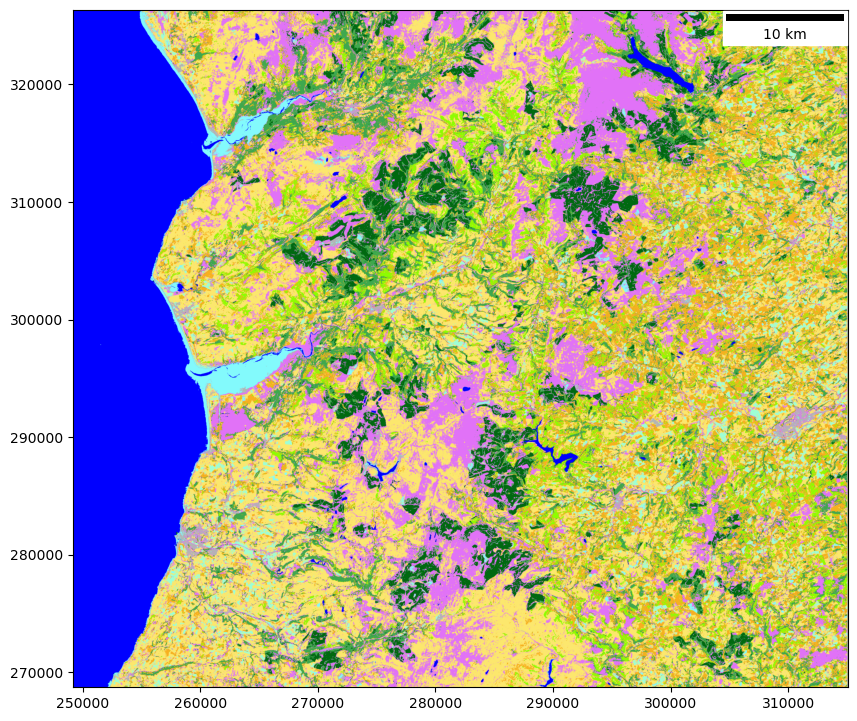

In [50]:
# Create the matplotlib figure
fig, ax = plt.subplots(figsize=(10, 10))

rsgislib.tools.mapping.create_thematic_raster_map(ax, out_cls_img)

Se genera una visualización comparativa con **Matplotlib** mostrando dos mapas lado a lado: en el primer panel se presenta la **imagen Sentinel-2 en falso color (bandas 8-9-3)**, y en el segundo, el **resultado de la clasificación supervisada**. Ambos mapas se limitan a la misma extensión espacial (**bbox definida**), facilitando la comparación visual entre la información espectral original y el mapa temático de clases generadas por el modelo.


Image Data Size: 1250 x 1250
Image Data Size: 1250 x 1250


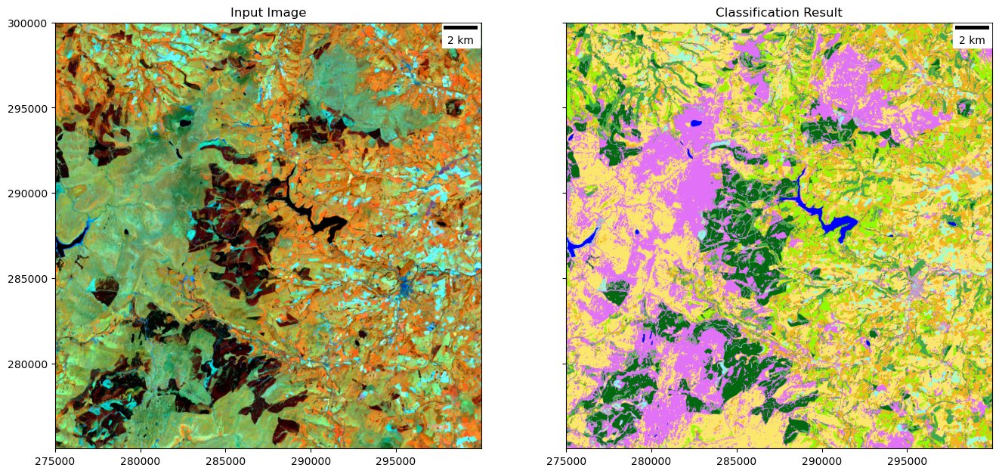

In [51]:
# Define a bbox for the subset to be displayed
sub_img_bbox = [275000, 300000, 275000, 300000]
# sub_img_bbox = [255000, 280000, 275000, 300000]
# sub_img_bbox = [295000, 300000, 295000, 300000]

# Create the matplotlib figure - in this case two plots so the NDVI
# and image are plotted alongside each other
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8), sharey=True)

# Add the Sentinel-2 image to the axis
rsgislib.tools.mapping.create_raster_img_map(
    ax1,
    input_img,
    img_bands=[8, 9, 3],
    img_stch=rsgislib.IMG_STRETCH_CUMULATIVE,
    bbox=sub_img_bbox,
    show_scale_bar=True,
)
ax1.title.set_text("Input Image")

# Add the classification to the seocnd axis.
rsgislib.tools.mapping.create_thematic_raster_map(ax2, out_cls_img, bbox=sub_img_bbox)
ax2.title.set_text("Classification Result")

Se genera una **leyenda personalizada** para el mapa de clasificación, utilizando los nombres de clase almacenados en el raster. Se construye un diccionario de colores y etiquetas a partir de la columna **`class_names`**, asegurando una visualización clara y ordenada. Además, se selecciona una fuente de texto compatible (**DejaVu Sans**) y se presenta la leyenda en un gráfico independiente con formato de **dos columnas**, facilitando su inclusión en informes o presentaciones.


Max. characters in class name: 19
Column width: 126
Image: 264 x  130


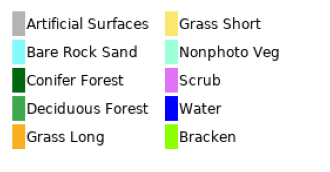

In [52]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import rsgislib.tools.plotting as rsg_plot

# ------------------------------------------------------------------
# 1. Build legend's dictionary based on raster
#    (ajusta 'class_names' si tu campo tiene otro nombre)
# ------------------------------------------------------------------
cls_info = rsg_plot.create_legend_info_dict(
    out_cls_img,
    cls_names_col="class_names",
    use_title_case=True,
    underscore_to_space=True,
)

# ------------------------------------------------------------------
# 2. Localizar una fuente TrueType que sí exista
#    DejaVu Sans viene con Matplotlib y está en casi todos los entornos
# ------------------------------------------------------------------
font_path = fm.findfont("DejaVu Sans", fallback_to_default=True)

# ------------------------------------------------------------------
# 3. Dibujar la leyenda sobre un eje Matplotlib
# ------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(4, 4))

rsg_plot.create_legend_img_mpl_ax(
    ax,
    legend_info=cls_info,
    n_cols=2,          # número de columnas de la leyenda
    font=font_path,    # ruta TTF garantizada
)

plt.show()

Se crea una **figura de tres paneles** para presentar de manera conjunta:

1. La **imagen Sentinel-2 en falso color (bandas 8-9-3)**,
2. El **resultado de la clasificación supervisada**, y
3. La **leyenda de clases** con colores y nombres correspondientes.

Se usa una fuente segura (**DejaVu Sans**) para evitar errores de renderizado y se ajusta el diseño con **`tight_layout()`** para una presentación clara y ordenada, ideal para informes o presentaciones finales.


Image Data Size: 1250 x 1250
Image Data Size: 1250 x 1250
Max. characters in class name: 19
Column width: 126
Image: 264 x  130


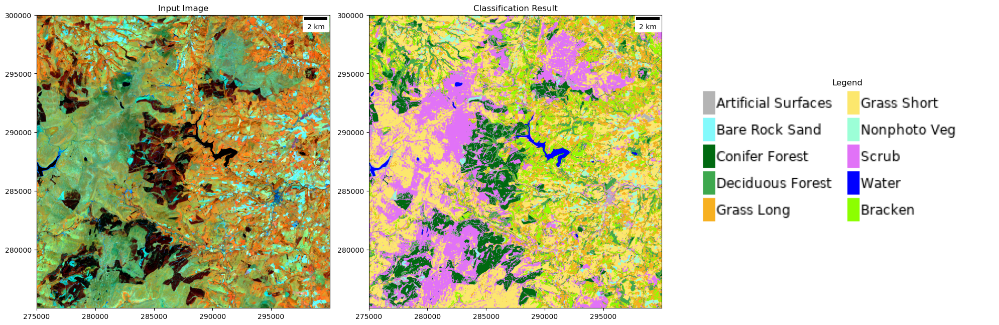

In [53]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import rsgislib.tools.mapping as rsg_map
import rsgislib.tools.plotting as rsg_plot

# ------------------------------------------------------------
# 1. Legend dictionary (already created earlier as `cls_info`)
#    cls_info = rsg_plot.create_legend_info_dict(...)
# ------------------------------------------------------------

# 2. Find a reliable TrueType font (DejaVu Sans ships with Matplotlib)
font_path = fm.findfont("DejaVu Sans", fallback_to_default=True)

# 3. Build a 3-panel figure
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 8), sharey=False)

# ---- Sentinel-2 RGB composite (bands 8-9-3) ----
rsg_map.create_raster_img_map(
    ax1,
    input_img,                       # Sentinel-2 subset (KEA / GeoTIFF)
    img_bands=[8, 9, 3],
    img_stch=rsgislib.IMG_STRETCH_CUMULATIVE,
    bbox=sub_img_bbox,
    show_scale_bar=True,
)
ax1.set_title("Input Image")

# ---- Pixel-based classification map ----
rsg_map.create_thematic_raster_map(
    ax2,
    out_cls_img,                     # Classified raster
    bbox=sub_img_bbox
)
ax2.set_title("Classification Result")

# ---- Legend panel (font argument prevents OSError) ----
rsg_plot.create_legend_img_mpl_ax(
    ax3,
    legend_info=cls_info,
    n_cols=2,                        # Columns in the legend table
    font=font_path                   # Explicit TTF path → no “cannot open resource”
)
ax3.set_title("Legend")

plt.tight_layout()
plt.show()

Se prepara el conjunto de **puntos de referencia (ground truth)** para la validación de la clasificación. Se crean carpetas para almacenar los **puntos de validación** y los **resultados estadísticos**. Luego, se convierte la capa de puntos del archivo **GeoPackage** a formato **GeoJSON**, asegurando compatibilidad con los módulos de validación de RSGISLib.


In [54]:
vec_file = "./data/test_points.gpkg"
vec_lyr = "cls_acc_assessment_pts_ref"

In [55]:
out_pts_dir = "acc_pts"
if not os.path.exists(out_pts_dir):
    os.mkdir(out_pts_dir)
    
out_stats_dir = "acc_stats"
if not os.path.exists(out_stats_dir):
    os.mkdir(out_stats_dir)

In [56]:
vec_refpts_file = os.path.join(out_pts_dir, "cls_acc_assessment_pts_ref.geojson")
vec_refpts_lyr = "cls_acc_assessment_pts_ref"

rsgislib.vectorutils.vector_translate(vec_file, vec_lyr, vec_refpts_file, vec_refpts_lyr, out_format="GeoJSON", del_exist_vec=True)

Deleting: acc_pts/cls_acc_assessment_pts_ref.geojson



  1%|          | 1/100 [00:00<00:20,  4.76it/s]


Se carga y estira la imagen Sentinel-2 (bandas 8-9-3) para mejorar su visualización, normalizando sus valores entre 0 y 1. Luego, se lee el archivo de **puntos de validación** en un **GeoDataFrame** y se superponen los puntos sobre la imagen usando **Matplotlib**, coloreándolos de forma automática según su clase de referencia (**`ref_pts`**). Esto permite una inspección visual de la distribución espacial de las muestras de validación frente a la imagen original.


Image Data Size: 3295 x 2880


<Axes: >

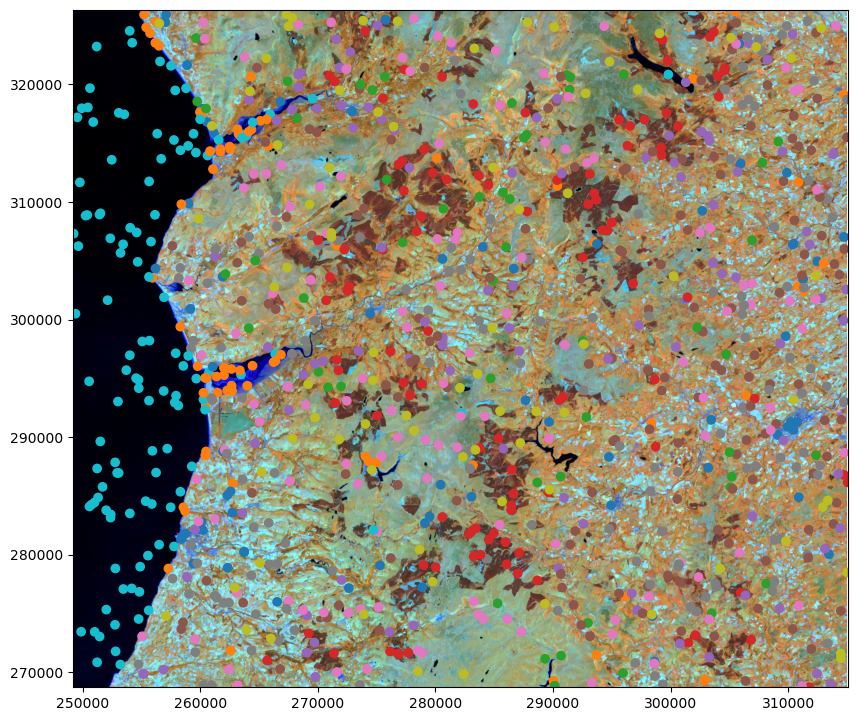

In [57]:
# Read image data
img_data, img_coords = rsgislib.tools.plotting.get_gdal_raster_mpl_imshow(
    input_img, bands=[8, 9, 3]
)

# Stretch the image data so is visualises appropriately and usefully
# In this case the resulting values will be between 0-1.
img_data_strch = rsgislib.tools.plotting.stdev_stretch_np_arr(img_data, no_data_val=0.0)

# Create a plot using the matplotlib library
fig, ax = plt.subplots(figsize=(10, 10))
# Add the stretched image data to the plot and define the spatial
# extent so the axis labels are the coordinates.
ax.imshow(img_data_strch, extent=img_coords)

# Read points to geopandas dataframe
points_gdf = geopandas.read_file(vec_refpts_file)
points_gdf 



# Plot the plots over the image data
# Note. Points are randomly coloured by reference class
points_gdf.plot(ax=ax, column='ref_pts')

In [58]:
points_gdf

,ref_pts,geometry
0,Bare_Rock_Sand,POINT (293492.332 306597.255)
1,Artificial_Surfaces,POINT (312462.332 304967.255)
2,Bare_Rock_Sand,POINT (306412.332 293567.255)
3,Artificial_Surfaces,POINT (259012.332 309877.255)
4,Artificial_Surfaces,POINT (305842.332 323467.255)
...,...,...
995,Water,POINT (250902.332 316807.255)
996,Water,POINT (257912.332 297147.255)
997,Water,POINT (249762.332 311677.255)
998,Water,POINT (253712.332 295707.255)


Se realiza la **población de clases** sobre los puntos de validación, asignando a cada punto el valor de clase resultante en el **raster clasificado**. Para ello, se compara el valor de clase en el ráster (usando la columna **`class_names`** de la RAT del raster) con el valor de referencia en el campo **`et_rl_cls`** de los puntos vectoriales. Esto prepara el vector de puntos para el cálculo de estadísticas de exactitud en los siguientes pasos.


In [59]:
rsgislib.classification.pop_class_info_accuracy_pts(
    input_img=out_cls_img,
    vec_file=vec_refpts_file,
    vec_lyr=vec_refpts_lyr,
    rat_class_col="class_names",
    vec_class_col="et_rl_cls",
    vec_ref_col=None,
    vec_process_col=None,
)

In [60]:
points_gdf = geopandas.read_file(vec_refpts_file)
points_gdf

,ref_pts,et_rl_cls,geometry
0,Bare_Rock_Sand,artificial_surfaces,POINT (293492.332 306597.255)
1,Artificial_Surfaces,grass_short,POINT (312462.332 304967.255)
2,Bare_Rock_Sand,artificial_surfaces,POINT (306412.332 293567.255)
3,Artificial_Surfaces,scrub,POINT (259012.332 309877.255)
4,Artificial_Surfaces,artificial_surfaces,POINT (305842.332 323467.255)
...,...,...,...
995,Water,water,POINT (250902.332 316807.255)
996,Water,water,POINT (257912.332 297147.255)
997,Water,water,POINT (249762.332 311677.255)
998,Water,water,POINT (253712.332 295707.255)


Se estandarizan los nombres de las clases de referencia en el campo **`ref_pts`**, asegurando que coincidan con las clases utilizadas en la clasificación (por ejemplo, pasando de **`Artificial_Surfaces`** a **`artificial_surfaces`**). Luego, se eliminan los puntos cuya clase en **`et_rl_cls`** sea **"NA"**, ya que no tienen asignación válida. Finalmente, el conjunto limpio de puntos de validación se guarda como un nuevo archivo **GeoJSON**, listo para el cálculo de métricas de exactitud.


In [61]:
points_gdf["ref_pts"] = points_gdf["ref_pts"].replace({"Artificial_Surfaces": "artificial_surfaces"})
points_gdf["ref_pts"] = points_gdf["ref_pts"].replace({"Grass_Short": "grass_short"})
points_gdf["ref_pts"] = points_gdf["ref_pts"].replace({"Scrub": "scrub"})
points_gdf["ref_pts"] = points_gdf["ref_pts"].replace({"Grass_Short": "grass_short"})
points_gdf["ref_pts"] = points_gdf["ref_pts"].replace({"NonPhoto_Veg": "nonphoto_veg"})
points_gdf["ref_pts"] = points_gdf["ref_pts"].replace({"Bare_Rock_Sand": "bare_rock_sand"})
points_gdf["ref_pts"] = points_gdf["ref_pts"].replace({"Grass_Long": "grass_long"})
points_gdf["ref_pts"] = points_gdf["ref_pts"].replace({"Bracken": "bracken"})
points_gdf["ref_pts"] = points_gdf["ref_pts"].replace({"Deciduous_Forest": "deciduous_forest"})
points_gdf["ref_pts"] = points_gdf["ref_pts"].replace({"Conifer_Forest": "conifer_forest"})
points_gdf["ref_pts"] = points_gdf["ref_pts"].replace({"Water": "water"})

In [62]:
vec_refpts_vld_file = os.path.join(out_pts_dir, "cls_acc_assessment_pts_ref_vld.geojson")
vec_refpts_vld_lyr = "cls_acc_assessment_pts_ref_vld"
print(points_gdf )
points_gdf = points_gdf.drop(points_gdf[points_gdf["et_rl_cls"] == "NA"].index)
points_gdf.to_file(vec_refpts_vld_file, driver="GeoJSON")

                 ref_pts            et_rl_cls                       geometry
0         bare_rock_sand  artificial_surfaces  POINT (293492.332 306597.255)
1    artificial_surfaces          grass_short  POINT (312462.332 304967.255)
2         bare_rock_sand  artificial_surfaces  POINT (306412.332 293567.255)
3    artificial_surfaces                scrub  POINT (259012.332 309877.255)
4    artificial_surfaces  artificial_surfaces  POINT (305842.332 323467.255)
..                   ...                  ...                            ...
995                water                water  POINT (250902.332 316807.255)
996                water                water  POINT (257912.332 297147.255)
997                water                water  POINT (249762.332 311677.255)
998                water                water  POINT (253712.332 295707.255)
999                water                water  POINT (252802.332 271797.255)

[1000 rows x 3 columns]


In [63]:
# Get unique values
print( points_gdf["ref_pts"].unique())

['bare_rock_sand' 'artificial_surfaces' 'nonphoto_veg' 'water' 'scrub'
 'grass_long' 'bracken' 'grass_short' 'deciduous_forest' 'conifer_forest']


Se calcula la **exactitud de la clasificación** comparando las clases predichas en el raster con las clases de referencia de los puntos de validación. La función **`calc_acc_metrics_vecsamples_img()`** genera métricas como **matriz de confusión**, **exactitud global (OA)**, **Kappa**, **precisión por clase**, y otras estadísticas. Los resultados se exportan tanto en formato **JSON** como en **CSV**, facilitando su posterior análisis o inclusión en informes.


## Resultados K=4, Normalizado, Dummy variables

In [64]:
# Import the calc_acc_metrics_vecsamples function from the 
# rsgislib.classification.classaccuracymetrics module.
from rsgislib.classification.classaccuracymetrics import calc_acc_metrics_vecsamples_img


out_json_file = os.path.join(out_stats_dir, "cls_rf_refl_acc_info.json")
out_csv_file = os.path.join(out_stats_dir, "cls_rf_refl_acc_info.csv")

calc_acc_metrics_vecsamples_img(
    vec_file=vec_refpts_vld_file,
    vec_lyr=vec_refpts_vld_lyr,
    ref_col="ref_pts",
    cls_col="et_rl_cls",
    cls_img=out_cls_img,
    img_cls_name_col="class_names",
    img_hist_col="Histogram",
    out_json_file=out_json_file,
    out_csv_file=out_csv_file,
)

{np.str_('artificial_surfaces'): {'precision': 0.5675675675675675,
  'recall': 0.6363636363636364,
  'f1-score': 0.6,
  'support': 66.0},
 np.str_('bare_rock_sand'): {'precision': 0.49,
  'recall': 0.6621621621621622,
  'f1-score': 0.5632183908045977,
  'support': 74.0},
 np.str_('bracken'): {'precision': 0.5342465753424658,
  'recall': 0.75,
  'f1-score': 0.624,
  'support': 52.0},
 np.str_('conifer_forest'): {'precision': 0.9883720930232558,
  'recall': 0.8173076923076923,
  'f1-score': 0.8947368421052632,
  'support': 104.0},
 np.str_('deciduous_forest'): {'precision': 0.7735849056603774,
  'recall': 0.8282828282828283,
  'f1-score': 0.8,
  'support': 99.0},
 np.str_('grass_long'): {'precision': 0.7565217391304347,
  'recall': 0.6170212765957447,
  'f1-score': 0.6796875,
  'support': 141.0},
 np.str_('grass_short'): {'precision': 0.6217948717948718,
  'recall': 0.7886178861788617,
  'f1-score': 0.6953405017921147,
  'support': 123.0},
 np.str_('nonphoto_veg'): {'precision': 0.924731

# CONCLUSIÓN
La clasificación obtenida con K=4, utilizando un stack normalizado e incorporando variables dummy derivadas del K-Means, muestra un desempeño general satisfactorio con una exactitud global del 72,5% y un índice Kappa de 0,69, lo que indica una fuerte concordancia entre el mapa clasificado y los datos de referencia.

Se evidencian altos niveles de precisión y F1-score en clases como "Water", "Conifer Forest" y "Deciduous Forest", lo que refleja la efectividad del modelo para discriminar coberturas con señales espectrales bien definidas.

La inclusión de las bandas dummy permitió mejorar la separación entre clases de vegetación, contribuyendo a un mejor desempeño en categorías como "Grass Short", "Nonphoto Veg" y "Scrub".

No obstante, persisten desafíos en la discriminación de clases con características espectrales similares, como "Artificial Surfaces" y "Bare Rock Sand", donde se observan errores de comisión y omisión que deberán ser abordados en futuros ajustes del modelo, ya sea mediante el uso de variables adicionales, ajuste de muestras o selección de nuevos atributos.

En general, el enfoque demuestra ser una estrategia robusta para la clasificación de coberturas del suelo a partir de datos Sentinel-2, y representa una base sólida para refinamientos posteriores.

## Resultados K=4, Normalizado

In [126]:
# Import the calc_acc_metrics_vecsamples function from the 
# rsgislib.classification.classaccuracymetrics module.
from rsgislib.classification.classaccuracymetrics import calc_acc_metrics_vecsamples_img


out_json_file = os.path.join(out_stats_dir, "cls_rf_refl_acc_info.json")
out_csv_file = os.path.join(out_stats_dir, "cls_rf_refl_acc_info.csv")

calc_acc_metrics_vecsamples_img(
    vec_file=vec_refpts_vld_file,
    vec_lyr=vec_refpts_vld_lyr,
    ref_col="ref_pts",
    cls_col="et_rl_cls",
    cls_img=out_cls_img,
    img_cls_name_col="class_names",
    img_hist_col="Histogram",
    out_json_file=out_json_file,
    out_csv_file=out_csv_file,
)

{np.str_('artificial_surfaces'): {'precision': 0.5714285714285714,
  'recall': 0.6666666666666666,
  'f1-score': 0.6153846153846154,
  'support': 66.0},
 np.str_('bare_rock_sand'): {'precision': 0.5154639175257731,
  'recall': 0.6756756756756757,
  'f1-score': 0.5847953216374269,
  'support': 74.0},
 np.str_('bracken'): {'precision': 0.41836734693877553,
  'recall': 0.7884615384615384,
  'f1-score': 0.5466666666666666,
  'support': 52.0},
 np.str_('conifer_forest'): {'precision': 0.9883720930232558,
  'recall': 0.8173076923076923,
  'f1-score': 0.8947368421052632,
  'support': 104.0},
 np.str_('deciduous_forest'): {'precision': 0.8333333333333334,
  'recall': 0.8080808080808081,
  'f1-score': 0.8205128205128205,
  'support': 99.0},
 np.str_('grass_long'): {'precision': 0.7090909090909091,
  'recall': 0.5531914893617021,
  'f1-score': 0.6215139442231076,
  'support': 141.0},
 np.str_('grass_short'): {'precision': 0.6413793103448275,
  'recall': 0.7560975609756098,
  'f1-score': 0.694029

# CONCLUSIÓN 
El modelo Random Forest aplicado al stack normalizado (sin incorporar variables dummy) alcanzó una exactitud global del 71,8% y un índice Kappa de 0,68, indicando un buen nivel de concordancia entre la clasificación y los datos de referencia, aunque ligeramente inferior al modelo que incluyó variables dummy.

Se observan mejores resultados en clases como "Water" (F1: 0.93), "Conifer Forest" (F1: 0.89) y "Deciduous Forest" (F1: 0.82), mostrando consistencia en la clasificación de coberturas bien diferenciadas espectralmente.

Por otro lado, se mantienen dificultades en la clasificación de clases con alta similitud espectral, como "Bare Rock Sand" y "Bracken", donde la precisión y el F1-Score siguen siendo bajos o moderados, reflejando confusión con otras clases vegetadas o de superficie descubierta.

En términos de balance global, el modelo muestra una exactitud balanceada (Balanced Accuracy) del 72,5% y un MCC (Coeficiente de correlación de Matthews) de 0,69, valores aceptables para un análisis de cobertura con 10 clases en imágenes de resolución media como Sentinel-2.

## Resultado K=4, sin normalizar

In [91]:
import pprint
cls_acc_stats_dict = rsgislib.tools.utils.read_json_to_dict(out_json_file)
pprint.pprint(cls_acc_stats_dict)

{'accuracy': 0.7057057057057057,
 'accuracy_conf_interval': [0.023646335077543407,
                            0.028260254117064072,
                            0.03359509800650984,
                            0.03719972225613536],
 'artificial_surfaces': {'f1-score': 0.6068965517241379,
                         'precision': 0.5569620253164557,
                         'recall': 0.6666666666666666,
                         'support': 66.0},
 'bal_accuracy_score': 0.7148267589624343,
 'bare_rock_sand': {'f1-score': 0.5730994152046783,
                    'precision': 0.5051546391752577,
                    'recall': 0.6621621621621622,
                    'support': 74.0},
 'bracken': {'f1-score': 0.5359477124183006,
             'precision': 0.40594059405940597,
             'recall': 0.7884615384615384,
             'support': 52.0},
 'class_area': {'artificial_surfaces': 56868000.0,
                'bare_rock_sand': 50665600.0,
                'bracken': 447122400.0,
                

# CONCLUSIÓN
El modelo Random Forest ejecutado sobre el stack original (sin normalizar y sin variables dummy) alcanzó una exactitud global del 70,6% y un índice Kappa de 0,67, valores que, si bien son aceptables, son ligeramente inferiores a los obtenidos con las otras dos configuraciones (normalizado y normalizado + dummy).

Se observó un buen desempeño en clases como "Water" (F1: 0.92) y "Conifer Forest" (F1: 0.91), con valores de precisión y recall altos. Sin embargo, en clases como "Bracken", "Grass Long" y "Bare Rock Sand", el modelo mostró f1-scores más bajos y una mayor dispersión de errores, reflejada en las tasas de omisión y comisión.

El modelo presentó una Balanced Accuracy de 71,5% y un MCC de 0,67, lo que indica una clasificación aceptable pero con menor equilibrio que las otras configuraciones evaluadas. Además, el Total Disagreement (D) fue de 30,5%, el más alto entre las tres configuraciones.

# ANÁLISIS COMPARATIVO
Los resultados muestran que la normalización de las bandas mejora ligeramente el desempeño del modelo, y que la incorporación de las variables dummy derivadas del clustering K-Means aporta un beneficio adicional en términos de exactitud global, balance de clases y reducción de los errores totales (D).

En consecuencia, la configuración con normalización + variables dummy se posiciona como la más robusta y precisa de las tres, recomendándose como base para futuras aplicaciones o para extender el análisis a nuevas áreas o periodos.